

# The Dataset

The dataset is sourced from the NASA repo https://ti.arc.nasa.gov/tech/dash/groups/pcoe/prognostic-data-repository/.

---

*Dataset Citation : J. Lee, H. Qiu, G. Yu, J. Lin, and Rexnord Technical Services (2007). IMS, University of Cincinnati. "Bearing Data Set", NASA Ames Prognostics Data Repository (http://ti.arc.nasa.gov/project/prognostic-data-repository), NASA Ames Research Center, Moffett Field, CA*

---
## Breif Description of Test Rig for Data Collection

This is a <em><b>"Run to Failure "</em></b> dataset.

Four bearings were installed on a shaft. The rotation speed was kept constant at 2000 RPM by an AC motor coupled to the shaft via rub belts.  A radial load of 6000 lbs is applied onto the shaft and bearing by a spring mechanism. All bearings are force lubricated.

Rexnord ZA-2115 double row bearings were installed on the shaft as shown in Figure 1. PCB 353B33 High Sensitivity Quartz ICP accelerometers were installed on the bearing housing (two accelerometers for each bearing [x- and y-axes] for data set 1, one accelerometer for each bearing for data sets 2 and 3). Sensor placement is also shown in figure. All failures occurred after exceeding designed life time of the bearing which is more than 100 million revolutions. 

![Image not Available](https://drive.google.com/uc?id=18StOAh4ugVJuhV__RpxeCq2lZNhePC9m)

*   Recording Duration:  February 12, 2004 10:32:39 to February 19, 2004 06:22:39
*   No. of Files: 984 
*   No. of Channels:  4 
*   Channel Arrangement:  Bearing 1 – Ch 1; Bearing2 – Ch 2; Bearing3 – Ch3; Bearing 4 – Ch 4.
*   File Recording Interval:  Every 10 minutes
*   File Format:  ASCII Description
---
At the end of the test-to-failure experiment, Outer race failure occurred in bearing 1. 

# Importing Required Packages

In [ ]:
!pip install pmdarima

     |████████████████████████████████| 1.4 MB 5.0 MB/s 
     |████████████████████████████████| 9.8 MB 41.6 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [ ]:
# Common imports
import os
import glob
import itertools
import datetime
import pandas as pd
import numpy as np

import seaborn as sns
# sns.set(color_codes=True)
import matplotlib.pyplot as plt
from statsmodels.stats import diagnostic as diag
%matplotlib inline

from numpy.random import seed
# from tensorflow import set_random_seed  # older version
import tensorflow as tf # Run tf.random.set_seed(x)

from keras.layers import Input, Dropout, Dense, LSTM, TimeDistributed, RepeatVector
from keras.layers.core import Dense 
from keras.models import Model, Sequential, load_model
from keras import regularizers
from keras.models import model_from_json
from keras.layers import Dense, ReLU, Dropout

from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

# from sklearn.preprocessing import MinMaxScaler
# import tensorflow as tf
# from tensorflow.keras.models import Model
# from tensorflow.keras import Input
# from tensorflow.keras.layers import Dense, ReLU, Dropout
# from tensorflow.keras.callbacks import TensorBoard
# # Loading tensorboard extension
# %load_ext tensorboard

import scipy.stats as stats
from scipy.stats import shapiro
import pylab
from scipy.stats import anderson
import warnings
warnings.filterwarnings("ignore")

import pmdarima as pm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from scipy import stats
from scipy.stats import normaltest
from statsmodels.stats import diagnostic as diag

from sklearn.decomposition import PCA

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')
# !unrar x /content/drive/MyDrive/Capstone_Project_Team8/2nd_test.rar

# Functions

## Data Collection and Preprocessing

In [ ]:
# Gear degradation occur gradually over time. 
# So one datapoint every 10 minutes can be used. 
# Each 10 minute datapoint is aggregated by mean absolute value of the vibration 
# recordings over all the 20,480 datapoints in each file. 
# This is then merged together in a single dataframe.

# data_dir = '4th_test/txt'
# dataset3 = pd.DataFrame() # data_frame to pass on to the function

# Function to consolidate by absolute mean
def consolidate_by_absolute_mean(data_dir, data_frame):
  for filename in os.listdir(data_dir):
    # print(filename)
    dataset=pd.read_csv(os.path.join(data_dir, filename), sep='\t')
    dataset_absolute_mean = np.array(dataset.abs().mean())
    dataset_absolute_mean = pd.DataFrame(dataset_absolute_mean.reshape(1,4))
    dataset_absolute_mean.index = [filename]
    data_frame = data_frame.append(dataset_absolute_mean)
    # data_frame.columns = ['Bearing 1','Bearing 2','Bearing 3','Bearing 4']
    data_frame.index = pd.to_datetime(data_frame.index, format='%Y.%m.%d.%H.%M.%S')
    data_frame = data_frame.sort_index()
    data_frame.to_csv(data_frame+'.csv')

# Assign column names after the dataframe generation

In [ ]:
# data_dir = '2nd_test'
# dataset3 = pd.DataFrame() # data_frame to pass on to the function

# Function to consolidate raw files data
def data_creation(data_dir, data_frame):
  Files = glob.glob(data_dir + "/*")
  temp = pd.DataFrame()
  for file in Files:
    temp = pd.read_csv(open(file,'r'), sep = "\s+", header = None)
    data_frame = data_frame.append(temp)
    # temp = pd.DataFrame(scale_df(temp))
    # data = data + list(temp.values.reshape(10,2048,4))
    # return data

# data_creation(data_dir, dataset3)

# Assign column names after the dataframe generation

In [ ]:
dataset1 = pd.read_csv('merged_dataset_BearingTest_1.csv', index_col=0)
dataset2 = pd.read_csv('merged_dataset_BearingTest_2.csv', index_col=0)
dataset3 = pd.read_csv('merged_dataset_BearingTest_3.csv', index_col=0)

## Graphical Summary Function

<font color = 'red'>**Graphical Summary provides the time series graphs along with the histogram of distribution of the vibration measurements.**

In [ ]:
# Graphical Summary Function

# Select the bearing column data from the dataset to be explored
# subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
# left  = 0.125  # the left side of the subplots of the figure
# right = 0.9    # the right side of the subplots of the figure
# bottom = 0.1   # the bottom of the subplots of the figure
# top = 0.9      # the top of the subplots of the figure
# wspace = 0.2   # the amount of width reserved for blank space between subplots
# hspace = 0.2   # the amount of height reserved for white space between subplots


def graphical_summary(bearing_data):
  fig, ax = plt.subplots(6, 1, figsize = (30, 36))
  plt.subplots_adjust(wspace = 0.3, hspace = 1)

  ax[0].plot(bearing_data)
  ax[0].set_title('Bearing Vibration Trend', fontsize = 16)
  ax[0].set_xlabel('Dates')
  ax[0].set_xticklabels(bearing_data.index, rotation = 90, fontsize = 8)
  ax[0].legend(bearing_data.columns)

  ax[1].plot(bearing_data.iloc[:int(0.25*bearing_data.shape[0]), :])
  ax[1].set_title('Bearing Vibration Trend (0% - 25% data)', fontsize = 16)
  ax[1].set_xlabel('Dates')
  ax[1].set_xticklabels(bearing_data.index[:int(0.5*bearing_data.shape[0])],
                        rotation = 90, fontsize = 8)
  ax[1].legend(bearing_data.columns)

  ax[2].plot(bearing_data.iloc[int(0.25*bearing_data.shape[0]):int(0.5*bearing_data.shape[0]), :])
  ax[2].set_title('Bearing Vibration Trend (25% - 50% data)', fontsize = 16)
  ax[2].set_xlabel('Dates')
  ax[2].set_xticklabels(bearing_data.index[int(0.25*bearing_data.shape[0]):int(0.5*bearing_data.shape[0])],
                        rotation = 90, fontsize = 8)
  ax[2].legend(bearing_data.columns)

  ax[3].plot(bearing_data.iloc[int(0.5*bearing_data.shape[0]):int(0.75*bearing_data.shape[0]), :])
  ax[3].set_title('Bearing Vibration Trend (50% - 75% data)', fontsize = 16)
  ax[3].set_xlabel('Dates')
  ax[3].set_xticklabels(bearing_data.index[int(0.5*bearing_data.shape[0]):int(0.75*bearing_data.shape[0])],
                        rotation = 90, fontsize = 8)
  ax[3].legend(bearing_data.columns)

  ax[4].plot(bearing_data.iloc[int(0.75*bearing_data.shape[0]):, :])
  ax[4].set_title('Bearing Vibration Trend (75% - 100% data)', fontsize = 16)
  ax[4].set_xlabel('Dates')
  ax[4].set_xticklabels(bearing_data.index[int(0.75*bearing_data.shape[0]):],
                        rotation = 90, fontsize = 8)
  ax[4].legend(bearing_data.columns)

  sns.histplot(bearing_data, ax = ax[5], kde = True)
  ax[5].set_title('Bearing Vibration Histogram', fontsize = 16)
  plt.show()
  print('\nShape of the data: ', bearing_data.shape)

## Data Segregation - Healthy and Abnormal

<font color = 'red'>**The time series is segregated into healthy and abnormal data taking the manual input for date which can be visually inspected using the earlier graphical summary function.**

In [ ]:
# Function to define normal and abnormal data

normal_end_date = "2004-02-16"                        # manually inspect and provide the end date for normal bearing vibration reading
def data_segregation(bearing_data, normal_end_date):
  len_train = len(bearing_data[bearing_data.index <= normal_end_date])
  len_test = len(bearing_data) - len_train
  # Segregating into train and test
  train = bearing_data.iloc[:len_train, :]
  test = bearing_data.iloc[len_train:, :]
  ratio = 0.8
  # Train data divided further into training and validation sets
  training = train.iloc[:int(0.8*len_train), :]
  validation = train.iloc[int(0.8*len_train):, ]
  return train, test, training, validation

## Statistical Outliers

<font color = 'red'>**For healthy data, the mean and standard deviation is calculated. The upper bounds and lower bounds are calculated using the following formulas -**

<font color = 'red'>**upper_bound = mean + 3 x standard deviation**

<font color = 'red'>**lower_bound = mean - 3 x standard deviation**

<font color = 'red'>**Datapoints outside these bounds are tagged as anomalies in the abnormal data**

In [ ]:
# Function to identify statistical outliers

def statistical_outliers(bearing_data, train_set):
  # original bearing data and the initial train_set before the training and validation split
  data_mean = train_set.mean()
  data_std = train_set.std()
  upper_bound = data_mean + 3*data_std        # upper bound using mean + 3*std
  lower_bound = data_mean - 3*data_std        # lower bound using mean - 3*std
  len_train = len(train_set)
  bearing_data['statistical_outliers'] = [np.nan if i<len_train
                                          else 1 if ((bearing_data.iloc[i, 0]<lower_bound.values) | (bearing_data.iloc[i, 0]>upper_bound.values))
                                          else 0 for i in range(len(bearing_data))]
  return bearing_data

## Inter Quartile Outliers

<font color = 'red'>**For healthy data, the mean and standard deviation is calculated. The upper limits and lower limits are calculated using the following formulas -**

<font color = 'red'>**upper_limit = Third Quartile + 1.5 x Inter Quartile Range**

<font color = 'red'>**lower_limit = First Quartile - 1.5 x Inter Quartile Range**

<font color = 'red'>**Datapoints outside these limits are tagged as anomalies in the abnormal data**

In [ ]:
# Function to identify outliers using Inter Quartile Ranges
def IQR_outliers(bearing_data, train_set):
  quartiles = pd.DataFrame(train_set.iloc[:, 0].values).quantile([0.25, 0.5, 0.75, 1])[0]
  IQRange = quartiles[0.75] - quartiles[0.25]
  median1 = quartiles[0.5]
  bp_ulimit = quartiles[0.75] + 1.5 * IQRange
  bp_llimit = quartiles[0.25] - 1.5 * IQRange
  bearing_data['iqr_outliers'] = [np.nan if i<len(train_set)
                                  else 1 if ((bearing_data.iloc[i, 0] < bp_llimit) | (bearing_data.iloc[i, 0] > bp_ulimit))
                                  else 0 for i in range(len(bearing_data))]
  return bearing_data

## Time Series Outliers

<font color = 'red'>**For healthy data, the arima model is fitted using auto arima approach**

<font color = 'red'>**Forecast with confidence interval is estimated for the length of the abnormal data**

<font color = 'red'>**Datapoints outside the confidence intervals are tagged as anomalies in the abnormal data**

In [ ]:
# Create function to test stationarity
def test_stationarity(timeseries, window = 12):

    # Determing rolling statistics
    rolmean = timeseries.rolling(window).mean()
    rolstd = timeseries.rolling(window).std()

    # Plot rolling statistics:
    fig = plt.figure(figsize=(12, 8))
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show()

    # Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC', maxlag = 20 )
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    pvalue = dftest[1]
    if pvalue < 0.01:
        print('\np-value = %.4f. The series is likely stationary.' % pvalue)
    else:
        print('\np-value = %.4f. The series is likely non-stationary.' % pvalue)
    print(dfoutput)

In [ ]:
# Visualize ACF and PACF plots
def acf_pacf_plots(timeseries):
  fig = plt.figure(figsize=(16,8))
  ax1 = fig.add_subplot(211)
  fig = sm.graphics.tsa.plot_acf(timeseries, lags=40, ax=ax1)
  ax2 = fig.add_subplot(212)
  fig = sm.graphics.tsa.plot_pacf(timeseries, lags=40, ax=ax2)

In [ ]:
# Function to identify outliers using time series model
def time_series_outliers(bearing_data, train_set, p = 30, d = 0, q = 30):
  stepwise_model = pm.auto_arima(train_set.iloc[:, 0].values, start_p=0, start_q=0,
                           max_p=p, max_q=q, m=0,
                           start_P=0, seasonal=False,
                           d=d, D=0, trace=True,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=False, n_fits = 100)
  model = stepwise_model.fit(train_set.iloc[:, 0])
  pred = model.predict_in_sample()
  len_pred = len(pred)
  fc, fc_ci = model.predict(n_periods=(len(bearing_data) - len(train_set)), return_conf_int = True, alpha = 0.05)
  len_fcasts = len(fc)
  bearing_data['ts_pred_fc'] = [pred[i] if i < len_pred else fc[i - len_pred] for i in range(len(bearing_data))]
  bearing_data['ts_lower'] = [np.nan if i < len_pred else fc_ci[i - len_pred, 0] for i in range(len(bearing_data))]
  bearing_data['ts_upper'] = [np.nan if i < len_pred else fc_ci[i - len_pred, 1] for i in range(len(bearing_data))]
  bearing_data['time_series_outliers'] = [np.nan if i < len_pred
                                          else 1 if (bearing_data.iloc[i, 0] < bearing_data['ts_lower'][i]) | (bearing_data.iloc[i, 0] > bearing_data['ts_upper'][i])
                                          else 0 for i in range(len(bearing_data))]

  return bearing_data

## Autoencoder

<font color = 'red'>**The autoencoder network is trained on data representing the normal state. When data is compressed in encoder phase, network learns the interactions between the various variables and in decoder phase it should be able to re-construct compressed data back to the original input. As the equipment degrades, we will see change in interaction between the variables (e.g. changes in vibrations, temperatures) thereby causing an increased error in the re-construction of the input variables.**

<font color = 'red'>**Here we will use the distribution of the reconstruction error for healthy equipment and define a threshold value for what to consider an anomaly. Then we calculate reconstruction loss for all data points in the test set, and compare the loss to the defined threshold value for flagging an anomaly.**

In [ ]:
# define the autoencoder network model
def autoencoder_model(X):
    inputs = Input(shape=(X.shape[1], X.shape[2]))
    L1 = LSTM(16, activation='relu', return_sequences=True, 
              kernel_regularizer=regularizers.l2(0.00))(inputs)
    L2 = LSTM(4, activation='relu', return_sequences=False)(L1)
    L3 = RepeatVector(X.shape[1])(L2)
    L4 = LSTM(4, activation='relu', return_sequences=True)(L3)
    L5 = LSTM(16, activation='relu', return_sequences=True)(L4)
    output = TimeDistributed(Dense(X.shape[2]))(L5)    
    model = Model(inputs=inputs, outputs=output)
    return model

In [ ]:
# Functions for identifying outliers using autoencoder

def autoencoder_outliers(bearing_data, train, test, nb_epochs = 100, batch_size = 10, seed = 123):
  
  # Scaling the inputs
  scaler = MinMaxScaler()
  X_train = scaler.fit_transform(train)
  X_test = scaler.transform(test)
  
  # reshape inputs for LSTM [samples, timesteps, features]
  X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
  X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
  
  # create the autoencoder model
  model = autoencoder_model(X_train)
  model.compile(optimizer='adam', loss='mae')
  model.summary()
  # nb_epochs = 100
  # batch_size = 10
  history = model.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                      validation_split=0.05).history
  
  # plot the training losses
  fig, ax = plt.subplots(3, 1, figsize=(20, 16), dpi=80)
  plt.subplots_adjust(wspace = 0.3, hspace = 0.5)

  ax[0].plot(history['loss'], 'b', label='Train', linewidth=2)
  ax[0].plot(history['val_loss'], 'r', label='Validation', linewidth=2)
  ax[0].set_title('Model loss', fontsize=16)
  ax[0].set_ylabel('Loss (mae)')
  ax[0].set_xlabel('Epoch')
  ax[0].legend(loc='upper right')

  # plot the loss distribution of the training set
  X_pred_train = model.predict(X_train)
  X_pred_train = X_pred_train.reshape(X_pred_train.shape[0], X_pred_train.shape[2])
  X_pred_train = pd.DataFrame(X_pred_train, columns=train.columns)
  X_pred_train.index = train.index
  scored_train = pd.DataFrame(index=train.index)
  Xtrain = X_train.reshape(X_train.shape[0], X_train.shape[2])
  scored_train['loss_mae'] = np.mean(np.abs(X_pred_train-Xtrain), axis = 1)
  sns.distplot(scored_train['loss_mae'], kde= True, color = 'blue', ax = ax[1])
  ax[1].set_title('Loss Distribution', fontsize=16)
  
  #setting the threshold
  Threshold = np.percentile(scored_train['loss_mae'].values, 95)
  scored_train['threshold'] = Threshold

  # calculate the loss on the test set
  X_pred_test = model.predict(X_test)
  X_pred_test = X_pred_test.reshape(X_pred_test.shape[0], X_pred_test.shape[2])
  X_pred_test = pd.DataFrame(X_pred_test, columns=test.columns)
  X_pred_test.index = test.index

  scored_test = pd.DataFrame(index=test.index)
  Xtest = X_test.reshape(X_test.shape[0], X_test.shape[2])
  scored_test['loss_mae'] = np.mean(np.abs(X_pred_test-Xtest), axis = 1)
  scored_test['threshold'] = Threshold
  # scored['Anomaly'] = scored['Loss_mae'] > scored['Threshold']
  # scored.head()
  scored = pd.concat([scored_train, scored_test])

  # Plotting loss against the threshold
  ax[2].plot(scored['loss_mae'], 'b', label='Loss_MAE', linewidth=2)
  ax[2].plot(scored['threshold'], 'r', label='Threshold', linewidth=2)
  ax[2].set_title('Loss vs Threshold', fontsize=16)
  ax[2].set_ylabel('Loss (MAE)')
  ax[2].set_xlabel('Date')
  ax[2].legend()
  plt.show()
  # Adding the results to the bearing dataset
  bearing_data = pd.concat([bearing_data, scored], axis = 1)
  
  bearing_data['autoencoder_outliers'] = [np.nan if i < len(scored_train) 
  else 1 if (bearing_data['loss_mae'][i]) > (bearing_data['threshold'][i]) else 0 for i in range(len(bearing_data))]
  
  return bearing_data

## Gaussian Mixture model

<font color = 'red'>**For healthy data, gaussian misture model is fitted and the most frequent class is determined after prediction for the healthy data**

<font color = 'red'>**Class is predicted for datapoints in abnormal data using the model**

<font color = 'red'>**Datapoints with classes other than the frequent class are tagged as anomalies in the abnormal data**

In [ ]:
# Gaussian Mixture model

def gmm_outliers(bearing_data, train, test, n_components = 3):
  gm = GaussianMixture(n_components=n_components, n_init=10)
  gm.fit(train)
  
  # Make prediction on training set
  predict_train = gm.predict(train)

  # Make prediction on testing set
  predict_test = gm.predict(test)

  # Anomalies basis the frequent class of datapoints
  freq_class = stats.mode(predict_train)[0][0]
  bearing_data['gmm_predictions'] = [predict_train[i] if i < len(predict_train) 
                                      else predict_test[i - len(predict_train)] for i in range(len(bearing_data))]

  # Anomalies basis the density                                    
  # densities = gm.score_samples(test)
  # density_threshold1 = np.percentile(densities, 5)
  # density_threshold2 = np.percentile(densities, 95)


  # Creation of GMM outliers
  bearing_data['gmm_outliers'] = [np.nan if i < len(predict_train) 
                                  else 1 if bearing_data['gmm_predictions'][i] != freq_class
                                  else 0 for i in range(len(bearing_data))]

  return bearing_data

## PCA + Mahalanobis

<font color ='red'>**When the equipment approaches failure, data (signal readings) it produces typically will have different distribution than data from healthy equipment.
So we can state Anamoly detection as a problem of estimating the probability that a data point belongs to a distribution.**

<font color ='red'>**First step is to find centroid of the sample points. Intuitively, the closer the point is to centroid, the more likely it is to belong to the set.
Since the distribution we might be dealing with could be non-spherical such as ellipsoidal, the probability of the test point belonging to the set will depend not only on the distance from the centroid, but also on the direction.**

<font color ='red'>**Signal data from sensors installed in equipments generally has high dimensionality. So we are using PCA for multivariate analysis by performing linear mapping of the data to a lower-dimensional space with 2 principal components representing the most important variance in original data.**

<font color ='red'>**In anamoly detection, we simply classify points between two classes, i.e. normal and anamoly. We use training data that only contains normal operating conditions to calculate the covariance matrix. After calculating the covariance matrix, we can estimate the set’s probability distribution representing ellipsoid.**

<font color ='red'>**We then use the Mahalanobis distance (MD) which is the distance of the test point from the centroid divided by the width of the ellipsoid in the direction of the test point. Using the distribution of MD for healthy equipment, we can define a threshold value for what to consider an anomaly.  To classify a test point, we compute the MD to the normal class, and classify the test point as an anomaly if the distance is above the threshold value.**

In [ ]:
def covariance_matrix(data, verbose=False):
    covariance_matrix = np.cov(data, rowvar=False)
    if is_pos_def(covariance_matrix):
        inv_covariance_matrix = np.linalg.inv(covariance_matrix)
        if is_pos_def(inv_covariance_matrix):
            return covariance_matrix, inv_covariance_matrix
        else:
            print("Error: Inverse of Covariance Matrix is not positive definite!")
    else:
        print("Error: Covariance Matrix is not positive definite!")

def MahalanobisDist(inv_cov_matrix, mean_distr, data, verbose=False):
    inv_covariance_matrix = inv_cov_matrix
    vars_mean = mean_distr
    diff = data - vars_mean
    md = []
    for i in range(len(diff)):
        md.append(np.sqrt(diff[i].dot(inv_covariance_matrix).dot(diff[i])))
    return md

def MD_detectOutliers(dist, extreme=False, verbose=False):
    k = 3. if extreme else 2.
    threshold = np.mean(dist) * k
    outliers = []
    for i in range(len(dist)):
        if dist[i] >= threshold:
            outliers.append(i)  # index of the outlier
    return np.array(outliers)

def MD_threshold(dist, extreme=False, verbose=False):
    k = 3. if extreme else 2.
    threshold = np.mean(dist) * k
    return threshold

def is_pos_def(A):
    if np.allclose(A, A.T):
        try:
            np.linalg.cholesky(A)
            return True
        except np.linalg.LinAlgError:
            return False
    else:
        return False

In [ ]:

def pca_outliers(bearings_xy, train_xy, test_xy):

  scaler = preprocessing.MinMaxScaler()
  X_train = pd.DataFrame(scaler.fit_transform(train_xy), 
                                columns=train_xy.columns, 
                                index=train_xy.index)
  # Random shuffle training data
  X_train.sample(frac=1)
  X_test = pd.DataFrame(scaler.transform(test_xy), 
                              columns=test_xy.columns, 
                              index=test_xy.index)

  pca = PCA(n_components=2, svd_solver= 'full')
  X_train_PCA = pca.fit_transform(X_train)
  X_train_PCA = pd.DataFrame(X_train_PCA)
  X_train_PCA.index = X_train.index

  X_test_PCA = pca.transform(X_test)
  X_test_PCA = pd.DataFrame(X_test_PCA)
  X_test_PCA.index = X_test.index

  data_train = np.array(X_train_PCA.values)
  data_test = np.array(X_test_PCA.values)

  cov_matrix, inv_cov_matrix  = covariance_matrix(data_train)

  mean_distr = data_train.mean(axis=0)

  dist_test = MahalanobisDist(inv_cov_matrix, mean_distr, data_test, verbose=False)
  dist_train = MahalanobisDist(inv_cov_matrix, mean_distr, data_train, verbose=False)
  threshold_MD = MD_threshold(dist_train, extreme = True)

  anomaly_train = pd.DataFrame()
  anomaly_train['Mob dist']= dist_train
  anomaly_train.index = X_train_PCA.index
  anomaly_test = pd.DataFrame()
  anomaly_test['Mob dist']= dist_test
  anomaly_test.index = X_test_PCA.index
  # Concatenate the two anomaly datasets
  anomaly = pd.concat([anomaly_train, anomaly_test])

  bearings_xy = pd.concat([bearings_xy, anomaly], axis = 1)

  bearings_xy['pca_outliers'] = [np.nan if i < len(train_xy)
                                else 1 if bearings_xy['Mob dist'][i] > threshold_MD
                               else 0 for i in range(len(bearings_xy))]
                              
  return bearings_xy

## Final Functions

In [ ]:
measure = pd.DataFrame(columns = ['bearing', 'statistical_outliers', 'iqr_outliers', 'time_series_outliers', 'autoencoder_outliers', 'gmm_outliers'])

In [ ]:
# single bearing dataset
# dataset = dataset2
# dataset.name = 'dataset2'
# Bearing = 'Bearing 1'
# data = pd.DataFrame(dataset[Bearing])

def initial_exploration(dataset, Bearing):
  data = pd.DataFrame(dataset[Bearing])
  bearing_data = pd.DataFrame()
  bearing_data = pd.concat([bearing_data, data], axis = 1)
  graphical_summary(bearing_data)
  measure_index = dataset.name + " " + Bearing
  return bearing_data, measure_index

def detect_outliers(bearing_data, measure, measure_index, normal_end_date="2004-02-16", window=30, nb_epochs=100, batch_size=10, n_components=2, p=30, d=0, q=30):
  """ normal_end_date - through visual exploration, window - for time series stationarity,
  nb_epochs, batch_size - for autoencoder, n_components - for GMM"""
  intermed = {'bearing':0, 'statistical_outliers':0, 'iqr_outliers':0, 'time_series_outliers':0, 'autoencoder_outliers':0, 'gmm_outliers':0}
  intermed['bearing'] = measure_index
  # data segregation
  train, test, training, validation = data_segregation(bearing_data, normal_end_date)
  
  # Statistical Anomalies
  bearing_data = statistical_outliers(bearing_data, train)
  min_index = min(bearing_data[bearing_data['statistical_outliers'] ==  1].index)
  min_loc = bearing_data.index.get_loc(min_index)
  intermed['statistical_outliers'] = min_loc
  
  # IQR Anomalies
  bearing_data = IQR_outliers(bearing_data, train)
  min_index = min(bearing_data[bearing_data['iqr_outliers'] ==  1].index)
  min_loc = bearing_data.index.get_loc(min_index)
  intermed['iqr_outliers'] = min_loc
  
  # Testing Stationarity
  test_stationarity(train, window = window)
  # ACF and PACF Plots
  acf_pacf_plots(train)
  # Time Series Outliers
  bearing_data = time_series_outliers(bearing_data, train, p = p, d = d, q = q)
  min_index = min(bearing_data[bearing_data['time_series_outliers'] ==  1].index)
  min_loc = bearing_data.index.get_loc(min_index)
  intermed['time_series_outliers'] = min_loc

  # Autoencoder Anomalies
  bearing_data = autoencoder_outliers(bearing_data, train, test, nb_epochs = nb_epochs, batch_size = batch_size)
  min_index = min(bearing_data[bearing_data['autoencoder_outliers'] ==  1].index)
  min_loc = bearing_data.index.get_loc(min_index)
  intermed['autoencoder_outliers'] = min_loc

  # GMM Outliers
  bearing_data = gmm_outliers(bearing_data, train, test, n_components = n_components)
  min_index = min(bearing_data[bearing_data['gmm_outliers'] ==  1].index)
  min_loc = bearing_data.index.get_loc(min_index)
  intermed['gmm_outliers'] = min_loc

  measure = measure.append(intermed, ignore_index = True)

  return bearing_data, measure

def graphical_result(bearing_data, Bearing, i1 = 480, i2 = 600):
  sample_data = bearing_data.iloc[i1:i2]
  plt.figure(figsize = (20, 10))
  plt.plot(sample_data[Bearing], c = 'magenta')
  plt.scatter(x = sample_data[sample_data['statistical_outliers'] == 1].index ,y = sample_data[sample_data['statistical_outliers'] == 1][Bearing], c = 'blue', s= 300, marker = 'o', alpha = 0.5)
  plt.scatter(x = sample_data[sample_data['time_series_outliers'] == 1].index ,y = sample_data[sample_data['time_series_outliers'] == 1][Bearing], c = 'black' , s = 200, marker = '*', alpha = 0.9)
  plt.scatter(x = sample_data[sample_data['autoencoder_outliers'] == 1].index ,y = sample_data[sample_data['autoencoder_outliers'] == 1][Bearing], c = 'red', s = 150, marker = 3, alpha = 0.9)
  plt.scatter(x = sample_data[sample_data['gmm_outliers'] == 1].index ,y = sample_data[sample_data['gmm_outliers'] == 1][Bearing], c = 'yellow', s = 50, marker = 'x', alpha = 0.9)
  plt.plot(sample_data['ts_pred_fc'], c = 'b')
  plt.plot(sample_data['ts_lower'], c = 'cyan')
  plt.plot(sample_data['ts_upper'], c = 'cyan')
  plt.xticks(rotation = 90, fontsize = 8)
  plt.legend(['Original', 'Forecast', '', '','Statistical Outliers', 'Time Series Outliers', 'AutoEncoder Outliers', 'GMM Outliers'])
  plt.show()


# Implementation

## Univariate

### Dataset 2 - Bearing 1 - Trial

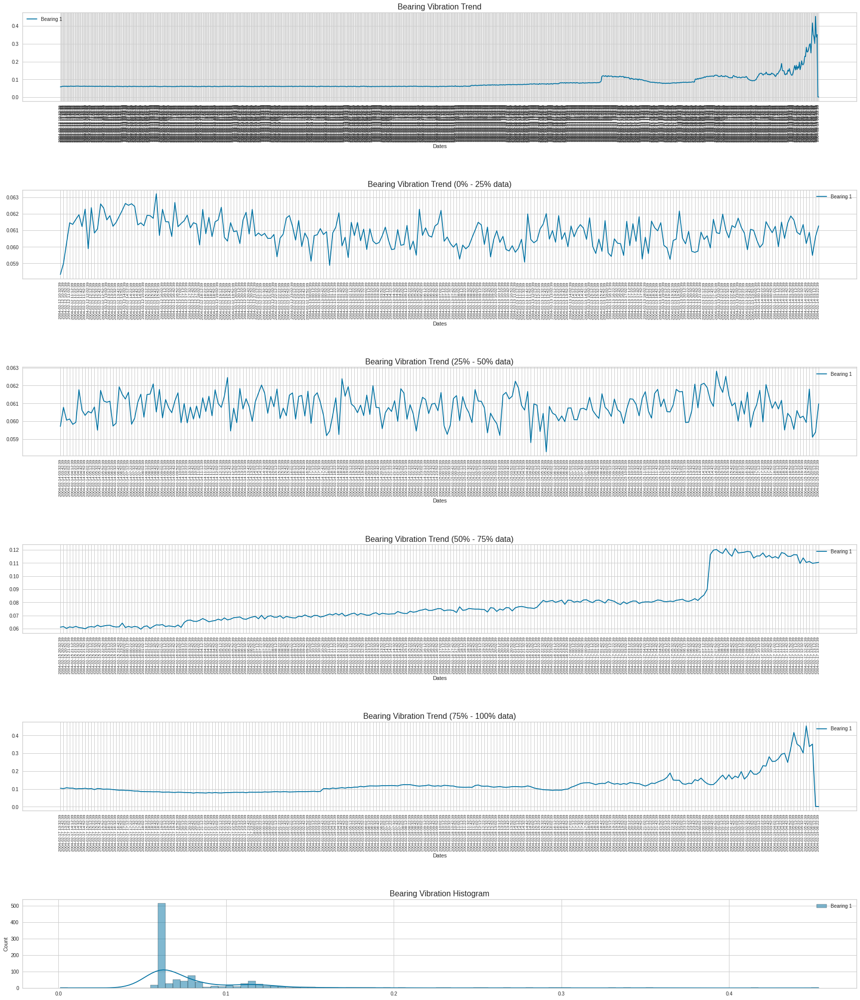


Shape of the data:  (984, 1)


In [ ]:
bearing_data = pd.DataFrame()
bearing_data = pd.concat([bearing_data, dataset2['Bearing 1']], axis = 1)
graphical_summary(bearing_data)

In [ ]:
normal_end_date = "2004-02-16" 
train, test, training, validation = data_segregation(bearing_data, normal_end_date)

In [ ]:
# Statistical Anomalies
bearing_data = statistical_outliers(bearing_data, train)

In [ ]:
# IQR Anomalies
bearing_data = IQR_outliers(bearing_data, train)

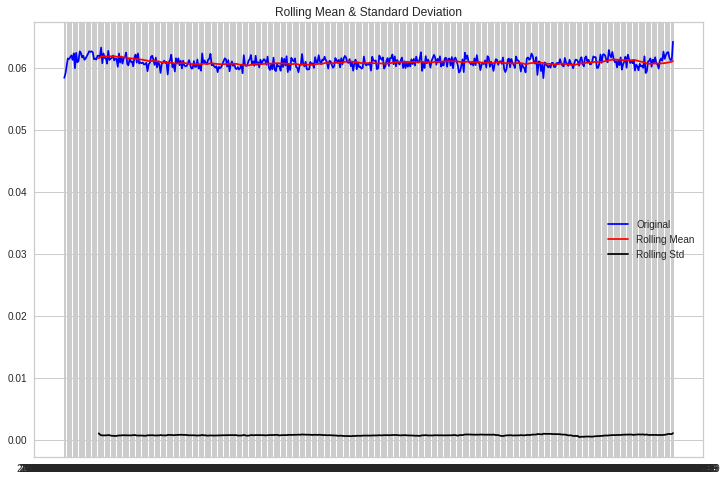

Results of Dickey-Fuller Test:

p-value = 0.0000. The series is likely stationary.
Test Statistic                -6.565669e+00
p-value                        8.171105e-09
#Lags Used                     4.000000e+00
Number of Observations Used    5.080000e+02
Critical Value (1%)           -3.443288e+00
Critical Value (5%)           -2.867246e+00
Critical Value (10%)          -2.569809e+00
dtype: float64


In [ ]:
# Testing Stationarity
test_stationarity(train, window = 30)

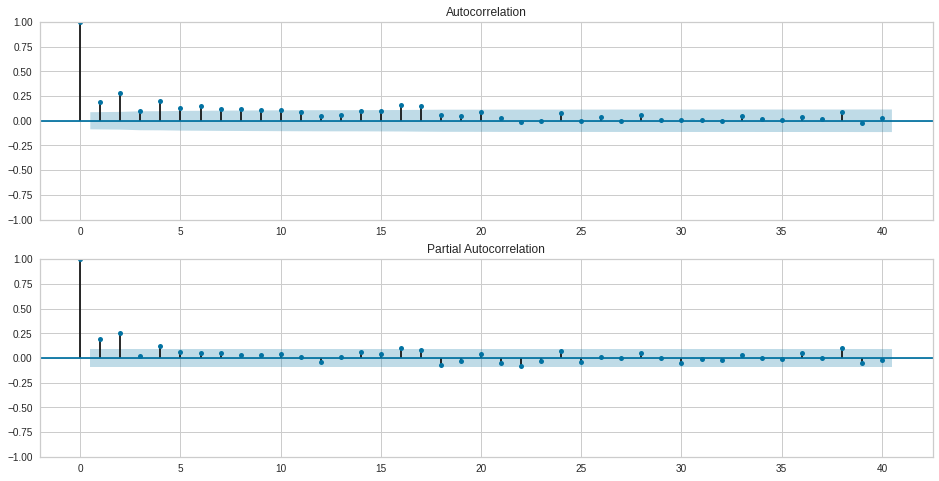

In [ ]:
# ACF and PACF Plots
acf_pacf_plots(train)

In [ ]:
bearing_data = time_series_outliers(bearing_data, train, p = 30, d = 0, q = 30)

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-1414.266, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=0.62 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-2702.826, Time=0.67 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-3164.099, Time=0.36 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-3559.637, Time=2.36 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-3846.609, Time=1.99 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-5872.577, Time=0.90 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-5854.176, Time=0.43 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=-5632.227, Time=0.56 sec
 ARIMA(1,0,4)(0,0,0)[0]             : AIC=-5254.472, Time=2.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=1.01 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-5660.610, Time=1.26 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=1.69 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=-5877.193, Time=0.48 sec
 ARIMA(3,0,0)(0,0,0

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1, 1)]            0         
                                                                 
 lstm (LSTM)                 (None, 1, 16)             1152      
                                                                 
 lstm_1 (LSTM)               (None, 4)                 336       
                                                                 
 repeat_vector (RepeatVector  (None, 1, 4)             0         
 )                                                               
                                                                 
 lstm_2 (LSTM)               (None, 1, 4)              144       
                                                                 
 lstm_3 (LSTM)               (None, 1, 16)             1344      
                                                             

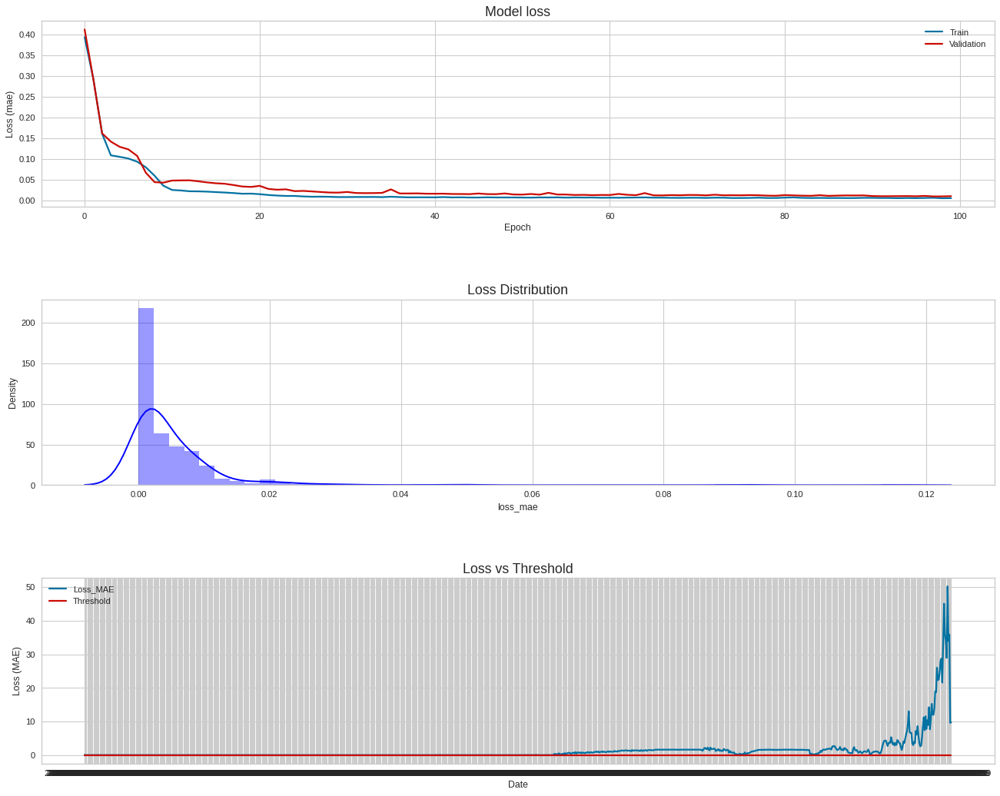

In [ ]:
# Autoencoder Anomalies
bearing_data = autoencoder_outliers(bearing_data, train, test, nb_epochs = 100, batch_size = 10)

In [ ]:
bearing_data = gmm_outliers(bearing_data, train, test, n_components = 2)

#### Result Exploration

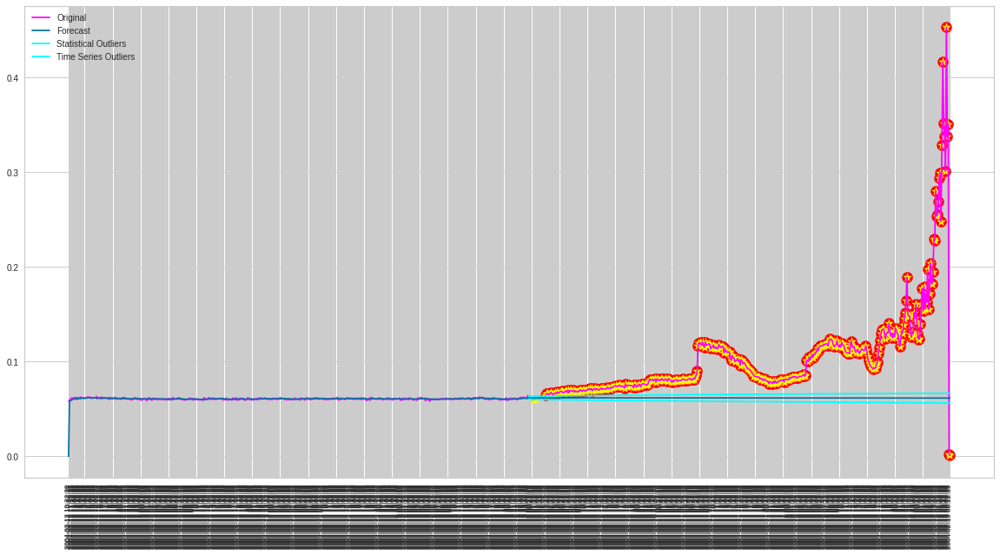

In [ ]:
plt.figure(figsize = (20, 10))
plt.plot(bearing_data['Bearing 1'], c = 'magenta')
plt.scatter(x = bearing_data[bearing_data['statistical_outliers'] == 1].index ,y = bearing_data[bearing_data['statistical_outliers'] == 1]['Bearing 1'], c = 'red', s= 150, marker = 'o')
plt.scatter(x = bearing_data[bearing_data['time_series_outliers'] == 1].index ,y = bearing_data[bearing_data['time_series_outliers'] == 1]['Bearing 1'], c = 'yellow', s = 100, marker = '*')
plt.plot(bearing_data['ts_pred_fc'], c = 'b')
plt.plot(bearing_data['ts_lower'], c = 'cyan')
plt.plot(bearing_data['ts_upper'], c = 'cyan')
plt.xticks(rotation = 90, fontsize = 8)
plt.legend(['Original', 'Forecast', 'Statistical Outliers', 'Time Series Outliers'])
plt.show()

In [ ]:
sample_data = bearing_data.iloc[480:600]

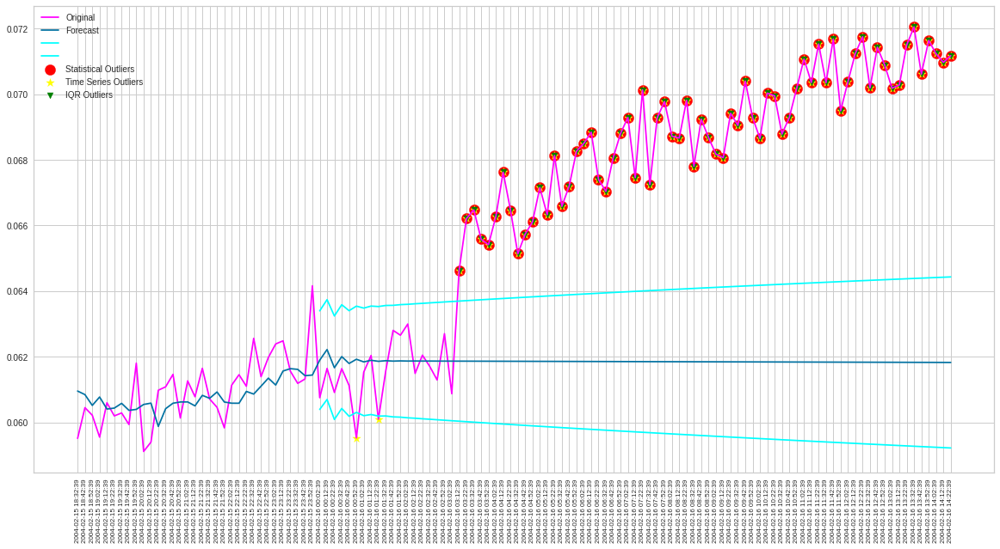

In [ ]:
plt.figure(figsize = (20, 10))
plt.plot(sample_data['Bearing 1'], c = 'magenta')
plt.scatter(x = sample_data[sample_data['statistical_outliers'] == 1].index ,y = sample_data[sample_data['statistical_outliers'] == 1]['Bearing 1'], c = 'red', s= 150, marker = 'o')
plt.scatter(x = sample_data[sample_data['time_series_outliers'] == 1].index ,y = sample_data[sample_data['time_series_outliers'] == 1]['Bearing 1'], c = 'yellow', s = 100, marker = '*')
plt.scatter(x = sample_data[sample_data['iqr_outliers'] == 1].index ,y = sample_data[sample_data['iqr_outliers'] == 1]['Bearing 1'], c = 'green', s = 50, marker = 'v')
plt.plot(sample_data['ts_pred_fc'], c = 'b')
plt.plot(sample_data['ts_lower'], c = 'cyan')
plt.plot(sample_data['ts_upper'], c = 'cyan')
plt.xticks(rotation = 90, fontsize = 8)
plt.legend(['Original', 'Forecast', '', '', 'Statistical Outliers', 'Time Series Outliers', 'IQR Outliers'])
plt.show()


In [ ]:
sample_data = bearing_data.iloc[480:600]

In [ ]:
def graphical_result(bearing_data):
  sample_data = bearing_data.iloc[480:600]
  plt.figure(figsize = (20, 10))
  plt.plot(sample_data['Bearing 1'], c = 'magenta')
  plt.scatter(x = sample_data[sample_data['statistical_outliers'] == 1].index ,y = sample_data[sample_data['statistical_outliers'] == 1]['Bearing 1'], c = 'blue', s= 300, marker = 'o', alpha = 0.5)
  plt.scatter(x = sample_data[sample_data['time_series_outliers'] == 1].index ,y = sample_data[sample_data['time_series_outliers'] == 1]['Bearing 1'], c = 'black' , s = 200, marker = '*', alpha = 0.9)
  plt.scatter(x = sample_data[sample_data['autoencoder_outliers'] == 1].index ,y = sample_data[sample_data['autoencoder_outliers'] == 1]['Bearing 1'], c = 'red', s = 150, marker = 3, alpha = 0.9)
  plt.scatter(x = sample_data[sample_data['gmm_outliers'] == 1].index ,y = sample_data[sample_data['gmm_outliers'] == 1]['Bearing 1'], c = 'yellow', s = 50, marker = 'x', alpha = 0.9)
  plt.plot(sample_data['ts_pred_fc'], c = 'b')
  plt.plot(sample_data['ts_lower'], c = 'cyan')
  plt.plot(sample_data['ts_upper'], c = 'cyan')
  plt.xticks(rotation = 90, fontsize = 8)
  plt.legend(['Original', 'Forecast', '', '','Statistical Outliers', 'Time Series Outliers', 'AutoEncoder Outliers', 'GMM Outliers'])
  plt.show()

### Dataset 2 - Bearing 1

In [ ]:
dataset = dataset2
dataset.name = 'dataset2'
Bearing = 'Bearing 1'

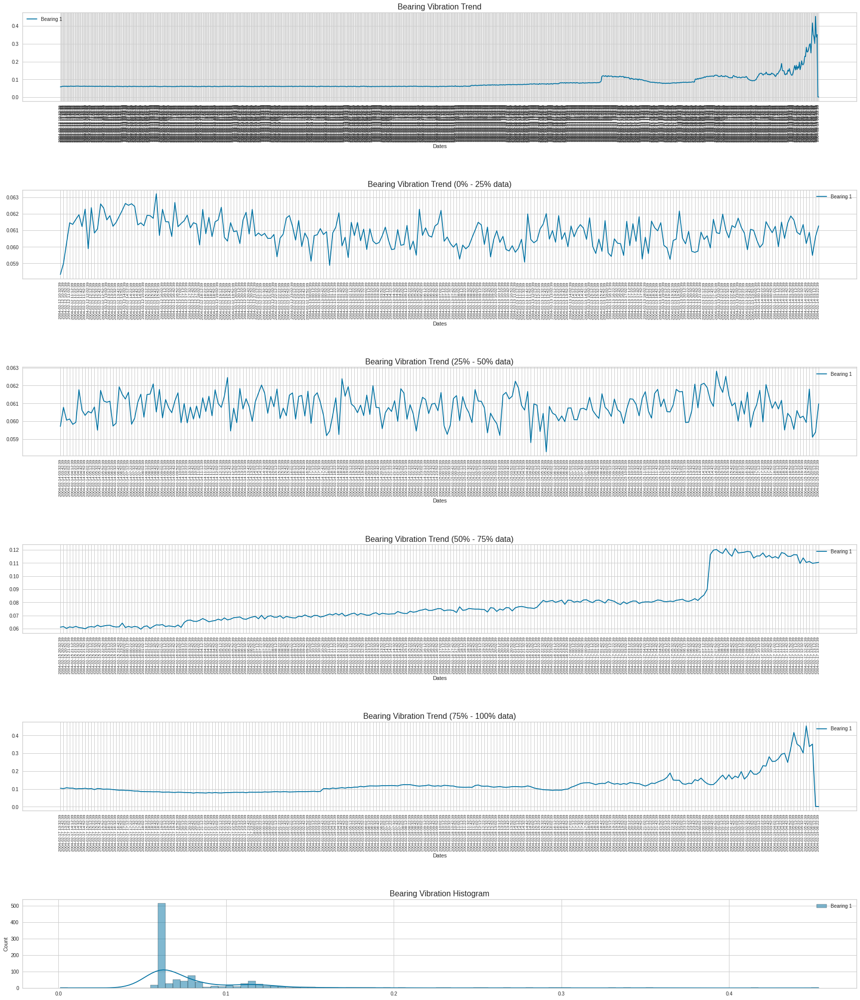


Shape of the data:  (984, 1)


In [ ]:
bearing_data, measure_index = initial_exploration(dataset, Bearing, i1 = 480, i2 = 600)

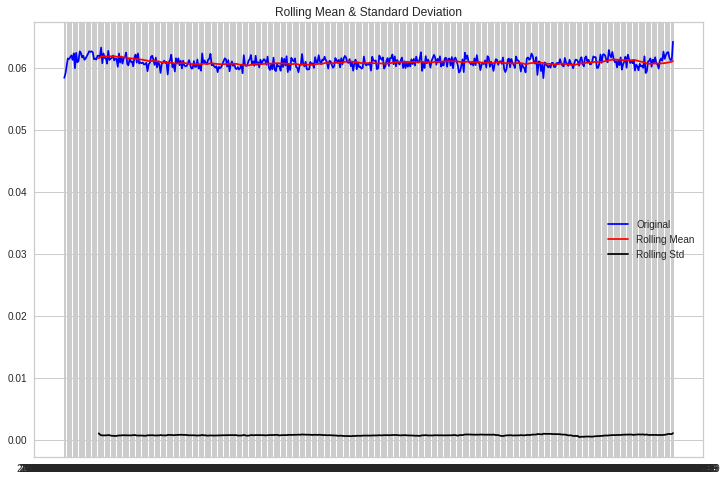

Results of Dickey-Fuller Test:

p-value = 0.0000. The series is likely stationary.
Test Statistic                -6.565669e+00
p-value                        8.171105e-09
#Lags Used                     4.000000e+00
Number of Observations Used    5.080000e+02
Critical Value (1%)           -3.443288e+00
Critical Value (5%)           -2.867246e+00
Critical Value (10%)          -2.569809e+00
dtype: float64
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-1414.266, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=0.76 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-2702.826, Time=1.02 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-3164.099, Time=0.57 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-3559.637, Time=3.34 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-3846.609, Time=2.12 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-5872.577, Time=0.98 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-5854.176, Time=0.52 sec
 AR

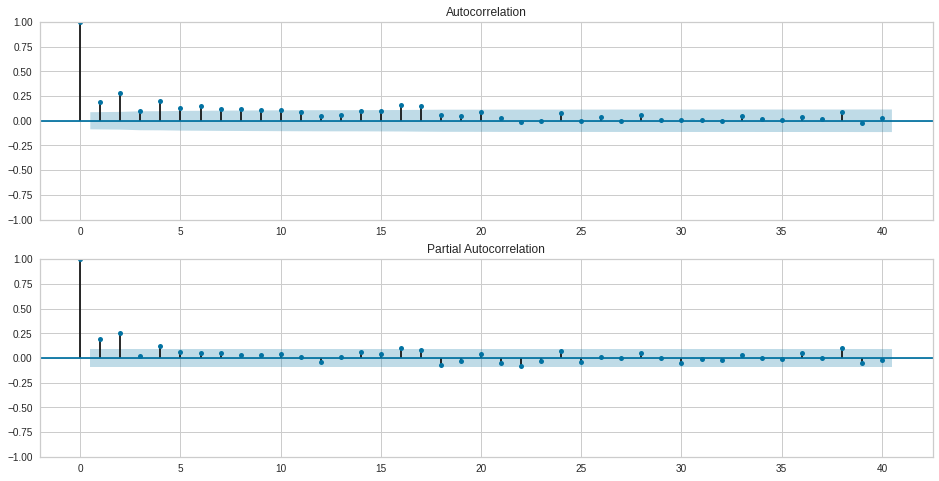

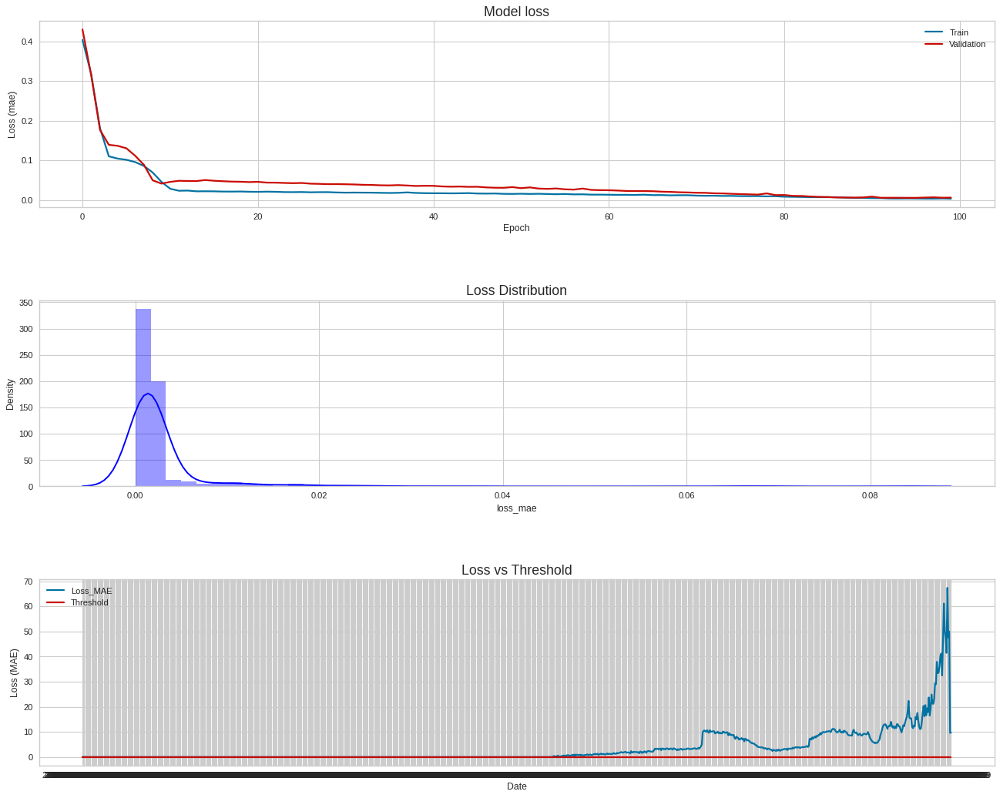

In [ ]:
bearing_data, measure = detect_outliers(bearing_data, measure, measure_index, normal_end_date="2004-02-16")

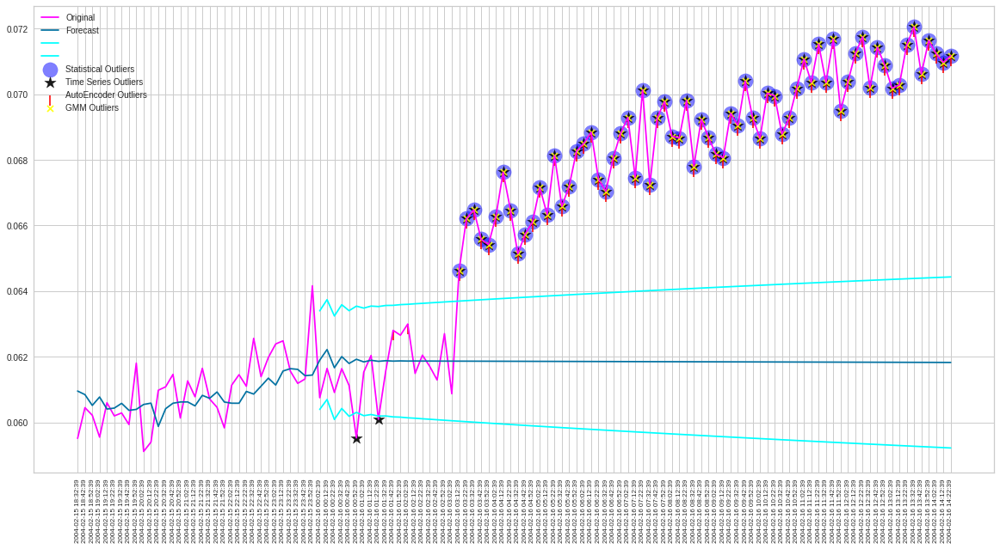

In [ ]:
graphical_result(bearing_data, Bearing)

In [ ]:
measure

,bearing,statistical_outliers,iqr_outliers,time_series_outliers,autoencoder_outliers,gmm_outliers
0,dataset2 Bearing 1,532,532,518,523,532


### Dataset 2 - Bearing 2

In [ ]:
dataset = dataset2
dataset.name = 'dataset2'
Bearing = 'Bearing 2'

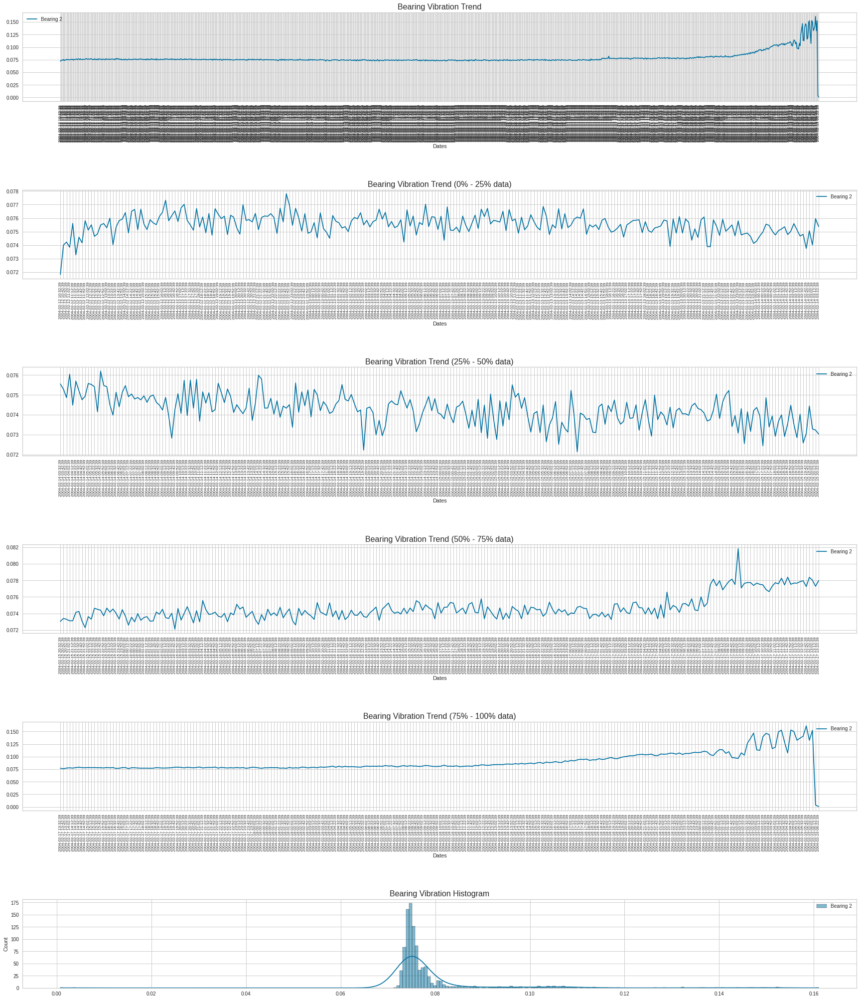


Shape of the data:  (984, 1)


In [ ]:
bearing_data, measure_index = initial_exploration(dataset, Bearing)

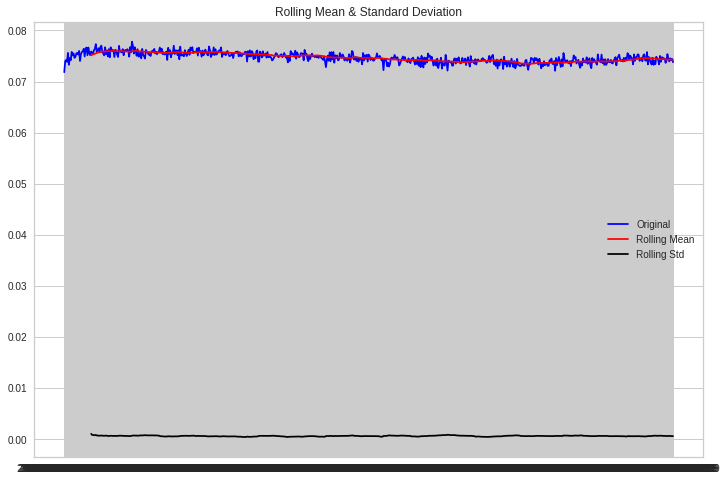

Results of Dickey-Fuller Test:

p-value = 0.3388. The series is likely non-stationary.
Test Statistic                  -1.885685
p-value                          0.338825
#Lags Used                      10.000000
Number of Observations Used    646.000000
Critical Value (1%)             -3.440513
Critical Value (5%)             -2.866024
Critical Value (10%)            -2.569158
dtype: float64
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-1542.537, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-3222.058, Time=0.41 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-3849.587, Time=0.58 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-4383.732, Time=0.93 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-4742.633, Time=0.63 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-7695.351, Time=0.20 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-7699.290, Time=0.40 sec
 ARIMA(1,0,3)

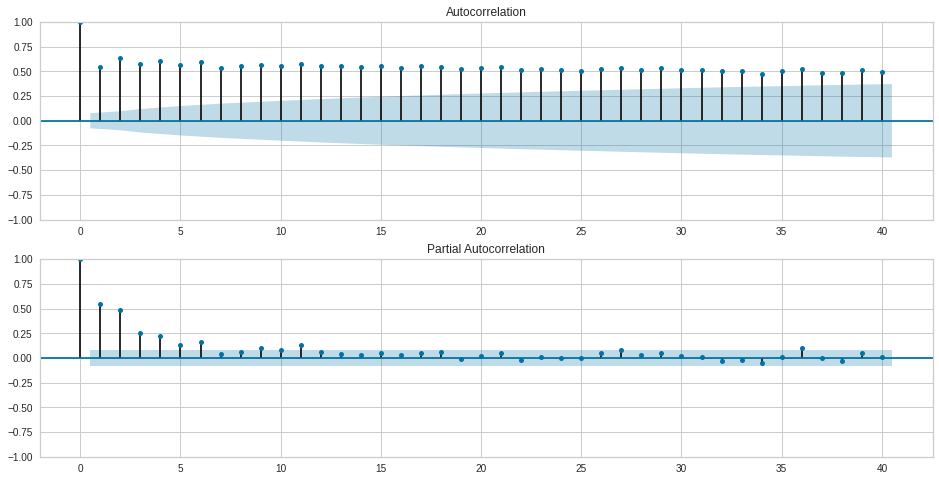

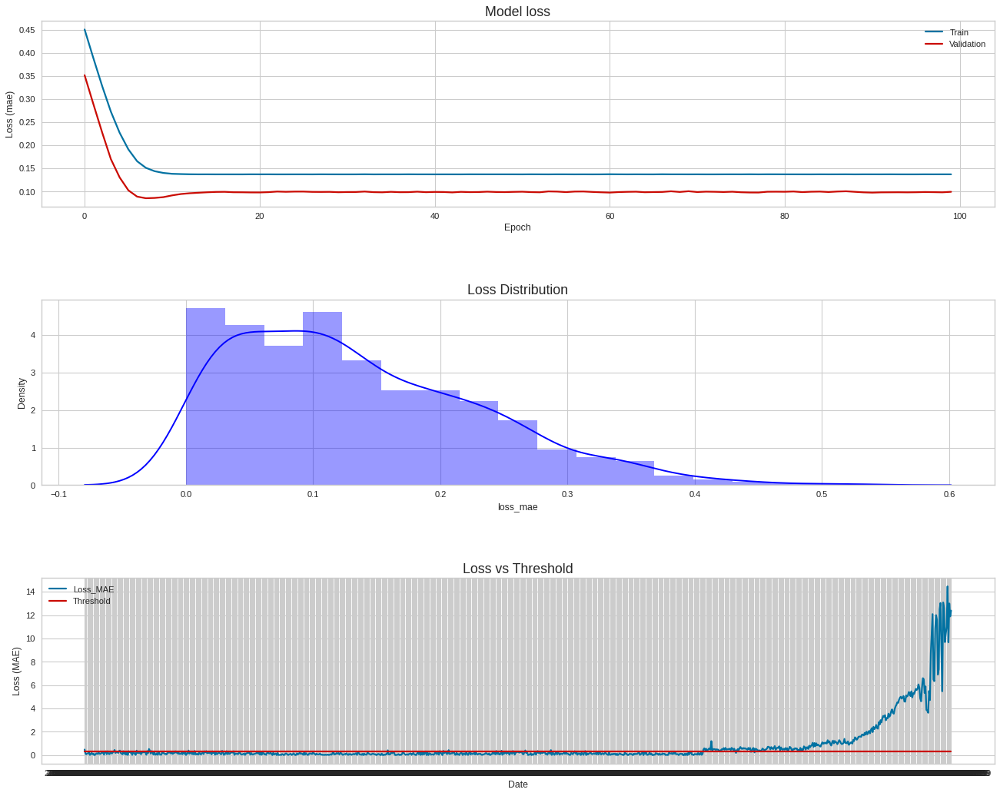

In [ ]:
bearing_data, measure = detect_outliers(bearing_data, measure, measure_index, normal_end_date="2004-02-17")

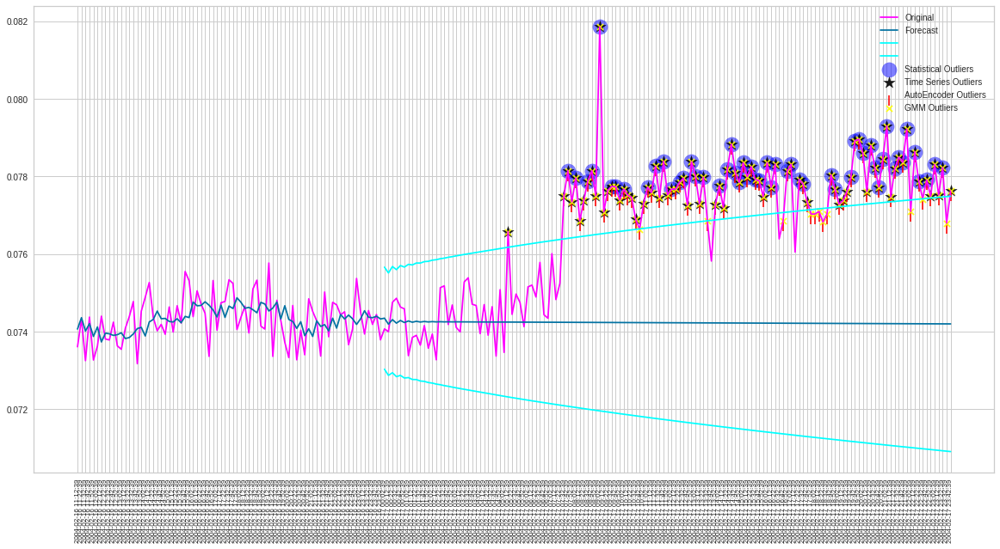

In [ ]:
graphical_result(bearing_data, Bearing, i1 = 580, i2 =800)

In [ ]:
measure

,bearing,statistical_outliers,iqr_outliers,time_series_outliers,autoencoder_outliers,gmm_outliers
0,dataset2 Bearing 1,532,532,518,523,532
1,dataset2 Bearing 2,703,702,688,702,688


### Dataset 2 - Bearing 3

In [ ]:
dataset = dataset2
dataset.name = 'dataset2'
Bearing = 'Bearing 3'

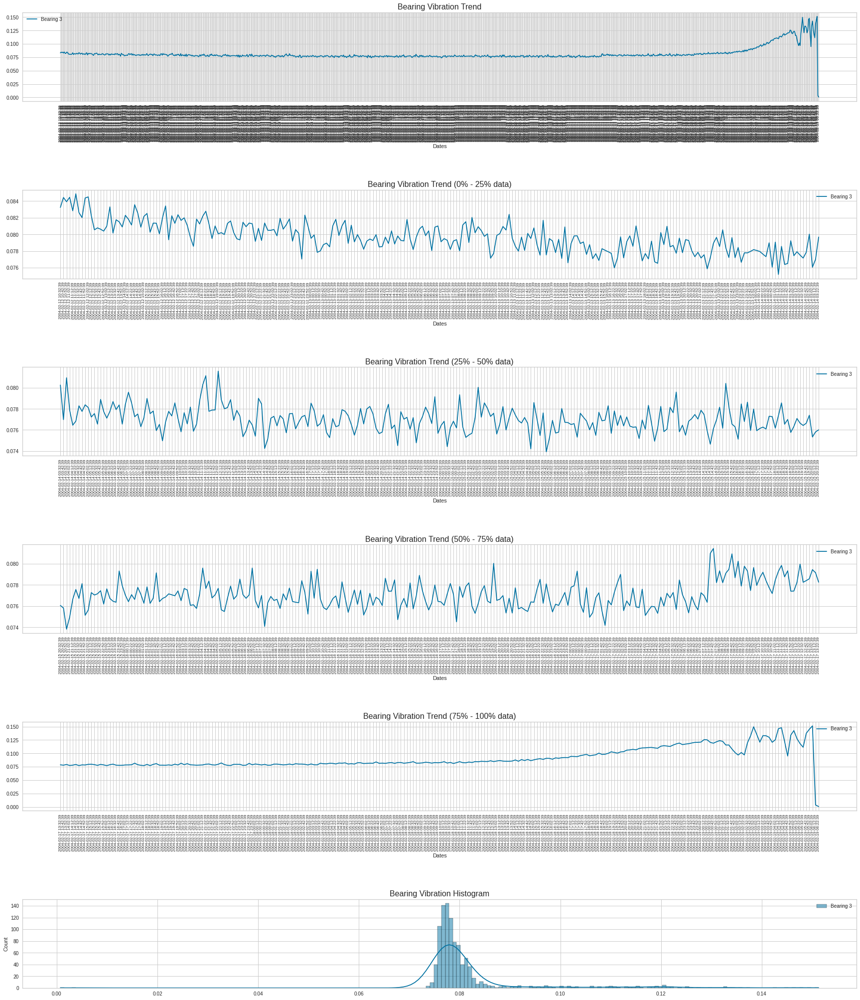


Shape of the data:  (984, 1)


In [ ]:
bearing_data, measure_index = initial_exploration(dataset, Bearing)

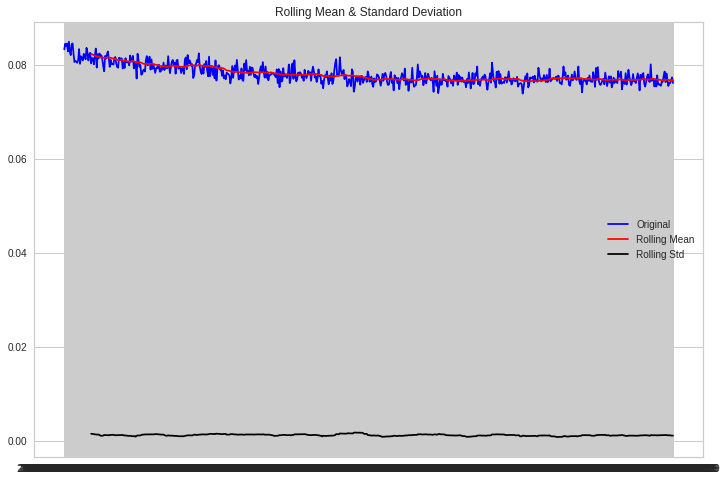

Results of Dickey-Fuller Test:

p-value = 0.0976. The series is likely non-stationary.
Test Statistic                  -2.578292
p-value                          0.097567
#Lags Used                      17.000000
Number of Observations Used    639.000000
Critical Value (1%)             -3.440625
Critical Value (5%)             -2.866074
Critical Value (10%)            -2.569184
dtype: float64
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-1485.643, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-2370.724, Time=0.27 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-3127.427, Time=0.41 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-3707.773, Time=0.66 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-4161.244, Time=1.44 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-4513.786, Time=1.27 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-6888.450, Time=0.41 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-6904.443, Time=0.56 sec
 ARIMA(

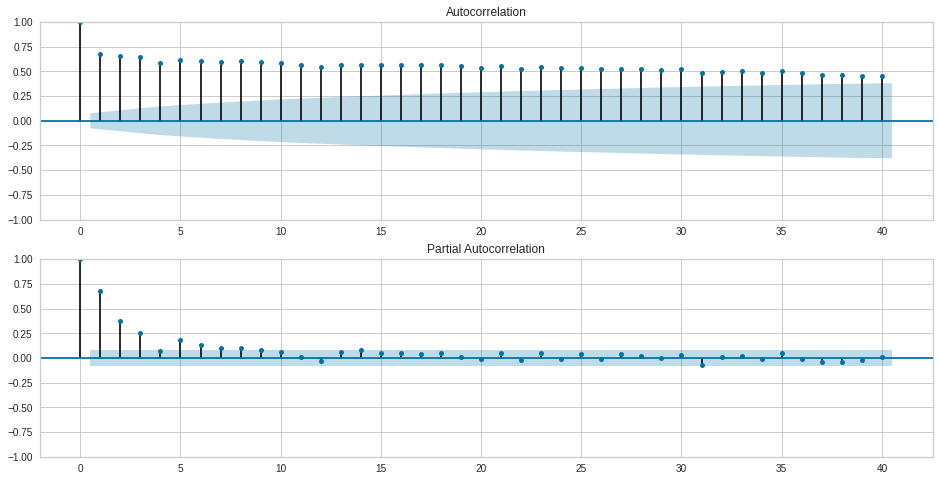

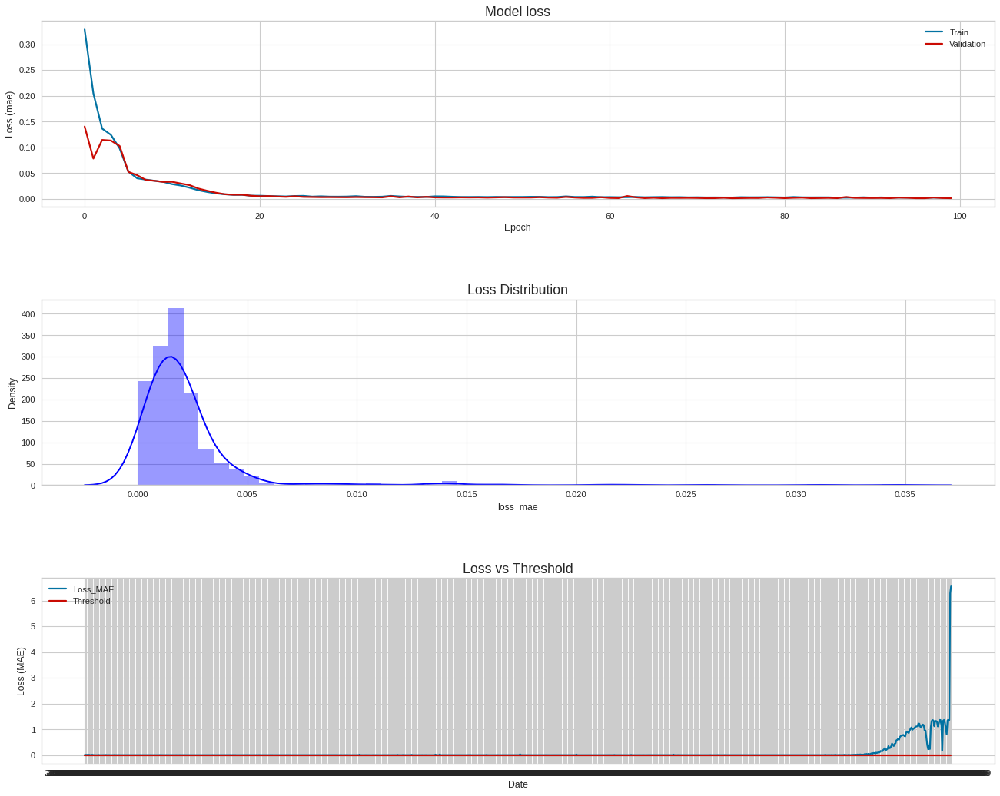

In [ ]:
bearing_data, measure = detect_outliers(bearing_data, measure, measure_index, normal_end_date="2004-02-17")

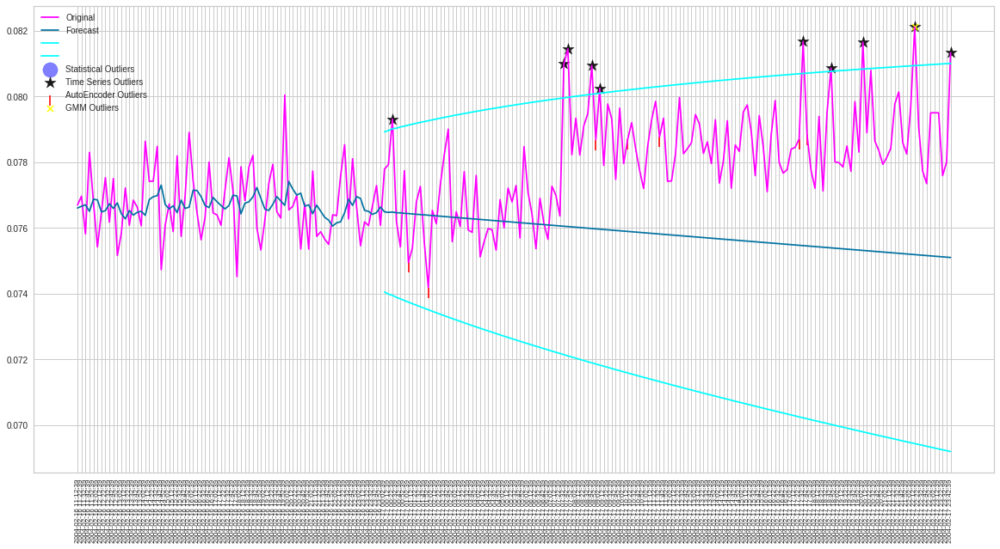

In [ ]:
graphical_result(bearing_data, Bearing, i1 = 580, i2 =800)

In [ ]:
measure

,bearing,statistical_outliers,iqr_outliers,time_series_outliers,autoencoder_outliers,gmm_outliers
0,dataset2 Bearing 1,532,532,518,523,532
1,dataset2 Bearing 2,703,702,688,702,688
3,dataset2 Bearing 3,840,840,659,663,790


### Dataset 2 - Bearing 4

In [ ]:
dataset = dataset2
dataset.name = 'dataset2'
Bearing = 'Bearing 4'

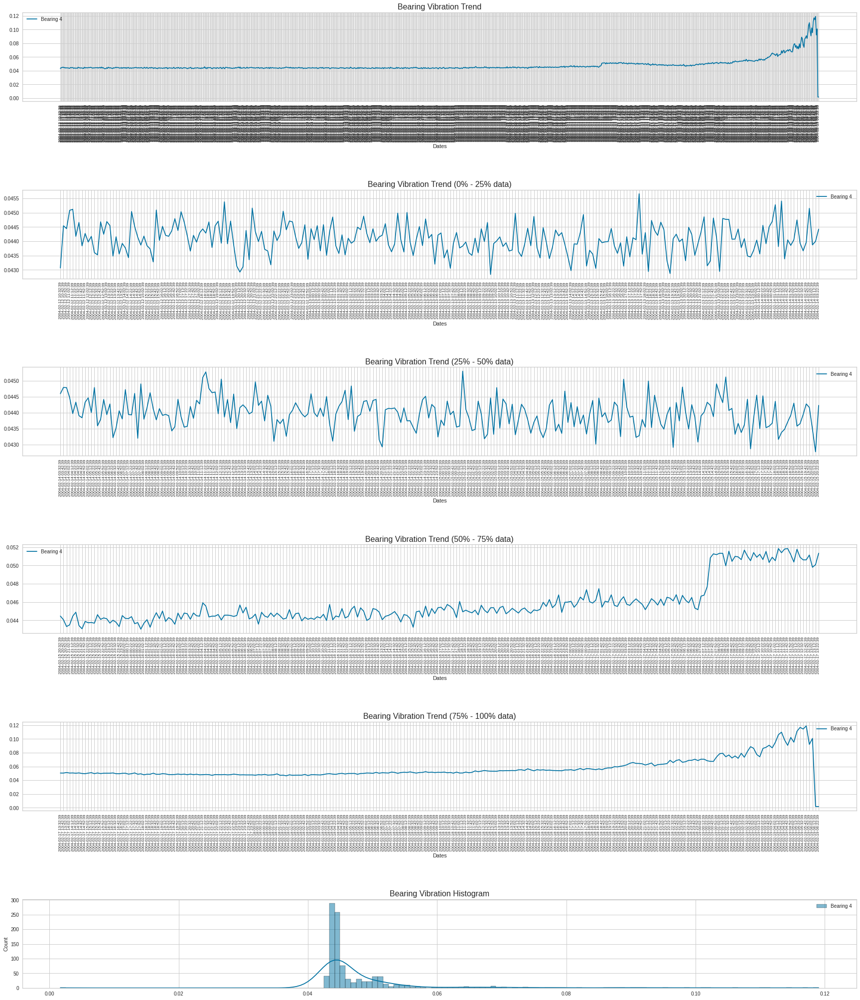


Shape of the data:  (984, 1)


In [ ]:
bearing_data, measure_index = initial_exploration(dataset, Bearing)

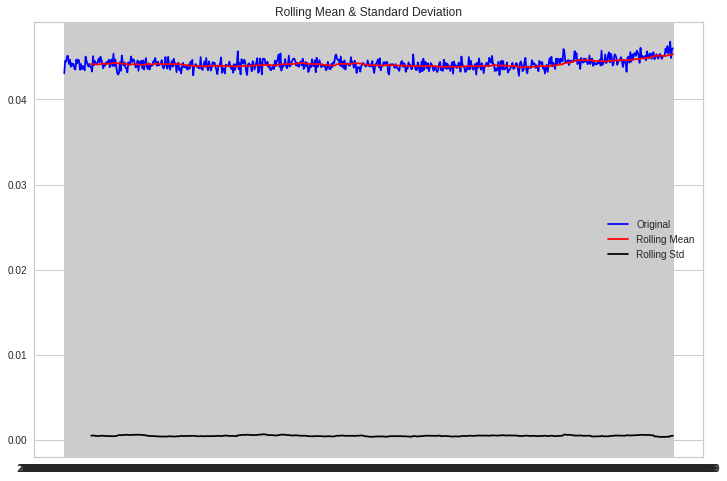

Results of Dickey-Fuller Test:

p-value = 0.9056. The series is likely non-stationary.
Test Statistic                  -0.426436
p-value                          0.905591
#Lags Used                      15.000000
Number of Observations Used    641.000000
Critical Value (1%)             -3.440593
Critical Value (5%)             -2.866060
Critical Value (10%)            -2.569177
dtype: float64
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-2232.348, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-3118.538, Time=0.28 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-3884.148, Time=0.37 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-4498.930, Time=0.50 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-4974.859, Time=0.70 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-5352.845, Time=1.19 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-8001.516, Time=0.77 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-7151.144, Time=0.70 sec
 ARIMA(

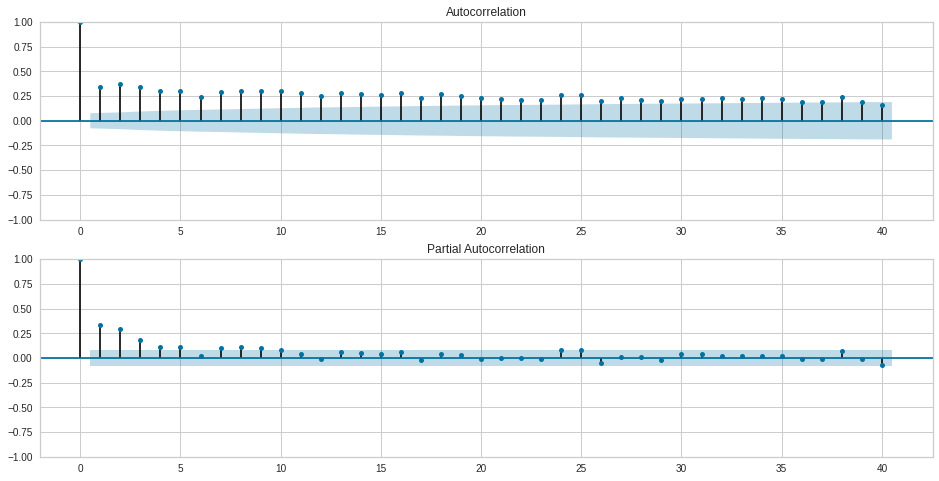

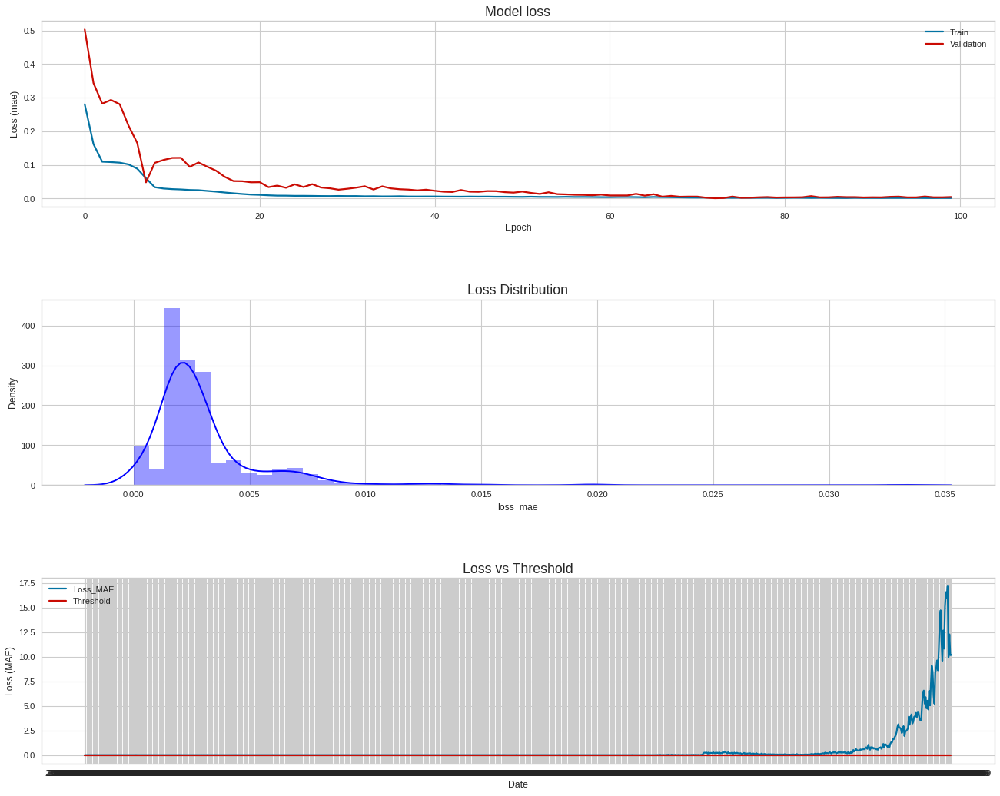

In [ ]:
bearing_data, measure = detect_outliers(bearing_data, measure, measure_index, normal_end_date="2004-02-17")

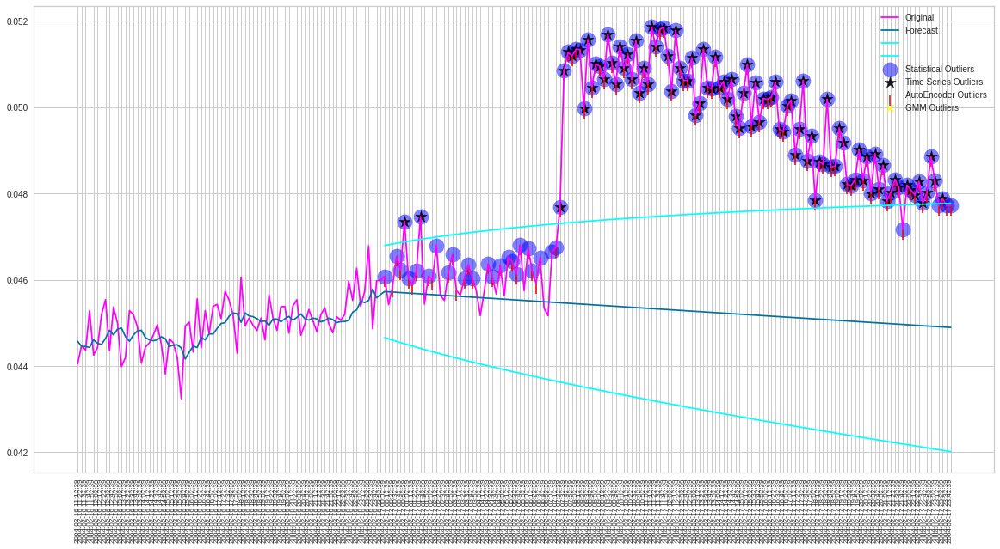

In [ ]:
graphical_result(bearing_data, Bearing, i1 = 580, i2 =800)

In [ ]:
measure

,bearing,statistical_outliers,iqr_outliers,time_series_outliers,autoencoder_outliers,gmm_outliers
0,dataset2 Bearing 1,532,532,518,523,532
1,dataset2 Bearing 2,703,702,688,702,688
2,dataset2 Bearing 3,840,840,659,663,790
3,dataset2 Bearing 4,657,657,662,657,886


### Dataset 3 - Bearing 1

In [ ]:
dataset = dataset3
dataset.name = 'dataset3'
Bearing = 'Bearing 1'

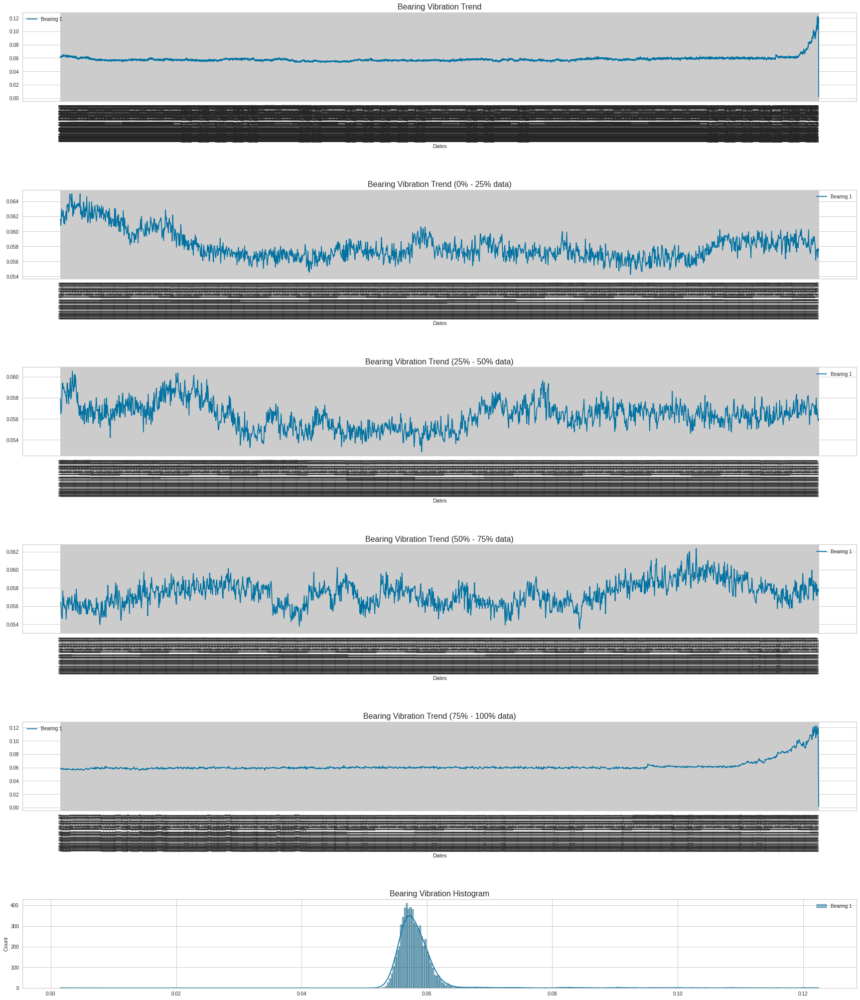


Shape of the data:  (6324, 1)


In [ ]:
bearing_data, measure_index = initial_exploration(dataset, Bearing)

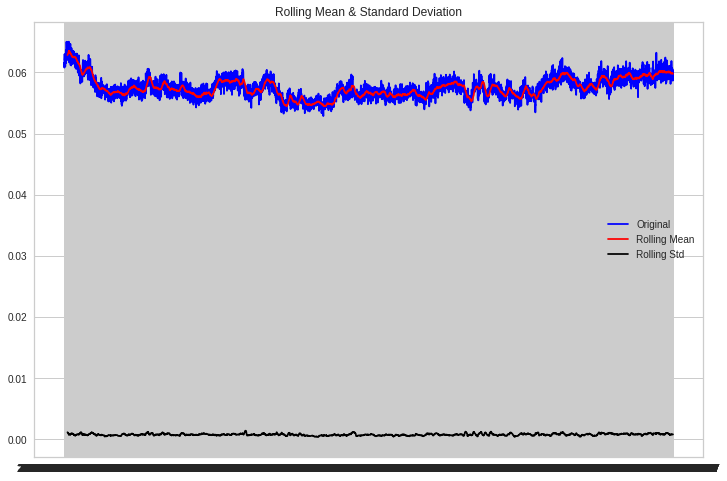

Results of Dickey-Fuller Test:

p-value = 0.0009. The series is likely stationary.
Test Statistic                   -4.128021
p-value                           0.000870
#Lags Used                       18.000000
Number of Observations Used    5466.000000
Critical Value (1%)              -3.431547
Critical Value (5%)              -2.862069
Critical Value (10%)             -2.567052
dtype: float64
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-15755.530, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-23154.339, Time=0.89 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-29610.070, Time=1.66 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-34679.823, Time=2.11 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-38687.492, Time=3.01 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-41736.088, Time=4.54 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-62422.107, Time=2.09 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-62503.043, Time=1.50 

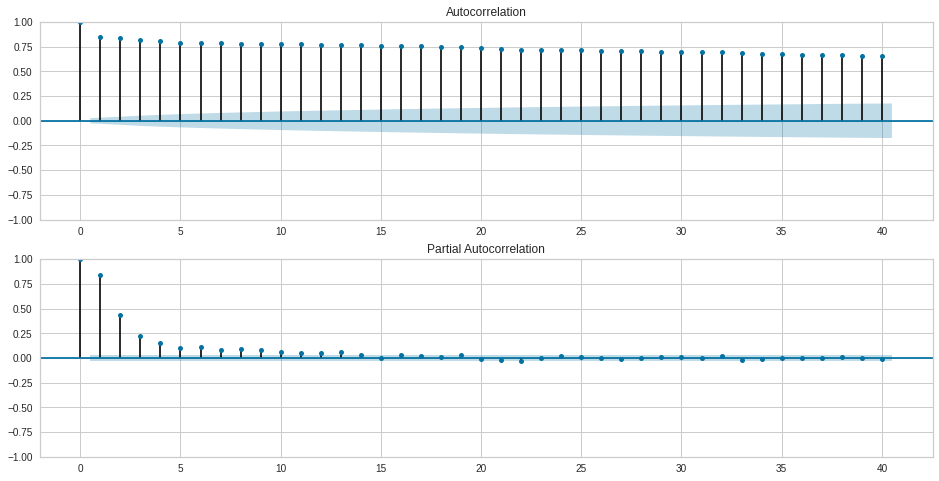

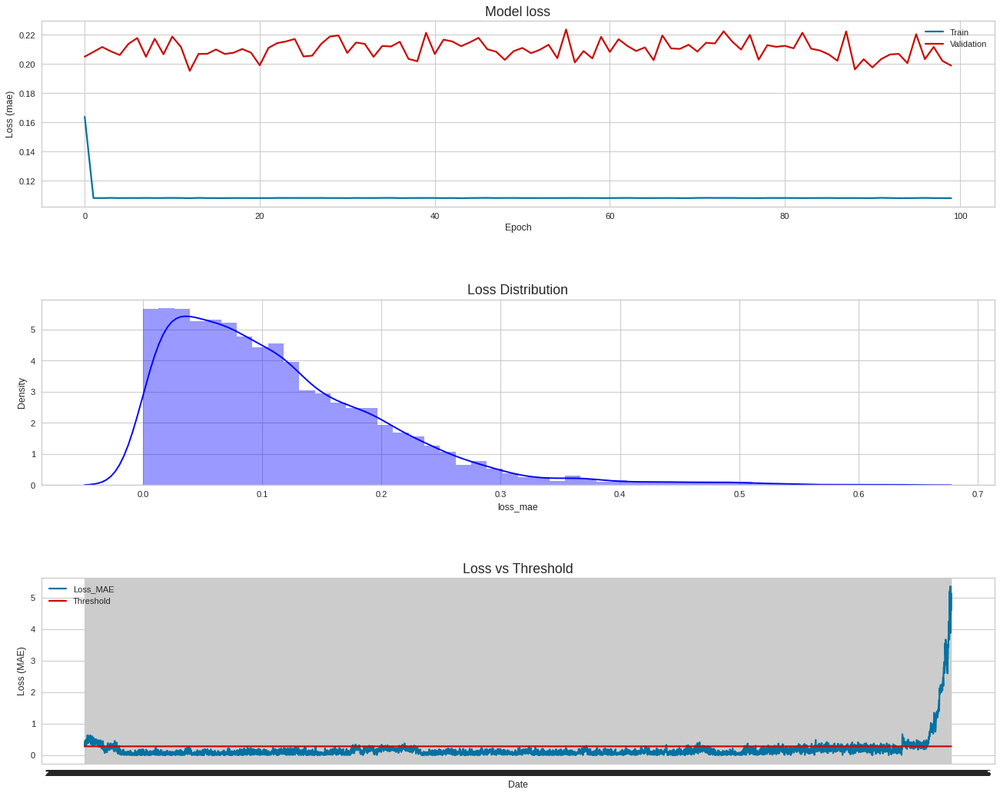

In [ ]:
bearing_data, measure = detect_outliers(bearing_data, measure, measure_index, normal_end_date="2004-04-12")

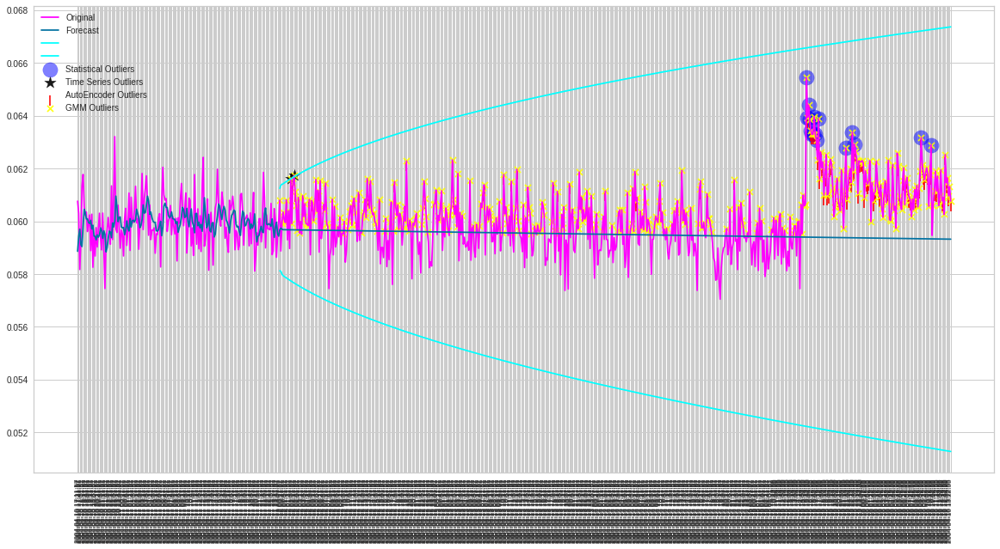

In [ ]:
graphical_result(bearing_data, Bearing, i1 = 5300, i2 =6100)

In [ ]:
measure

,bearing,statistical_outliers,iqr_outliers,time_series_outliers,autoencoder_outliers,gmm_outliers
0,dataset2 Bearing 1,532,532,518,523,532
1,dataset2 Bearing 2,703,702,688,702,688
2,dataset2 Bearing 3,840,840,659,663,790
3,dataset2 Bearing 4,657,657,662,657,886
4,dataset3 Bearing 1,5967,5601,5495,5485,5485


### Dataset 3 - Bearing 2

In [ ]:
dataset = dataset3
dataset.name = 'dataset3'
Bearing = 'Bearing 2'

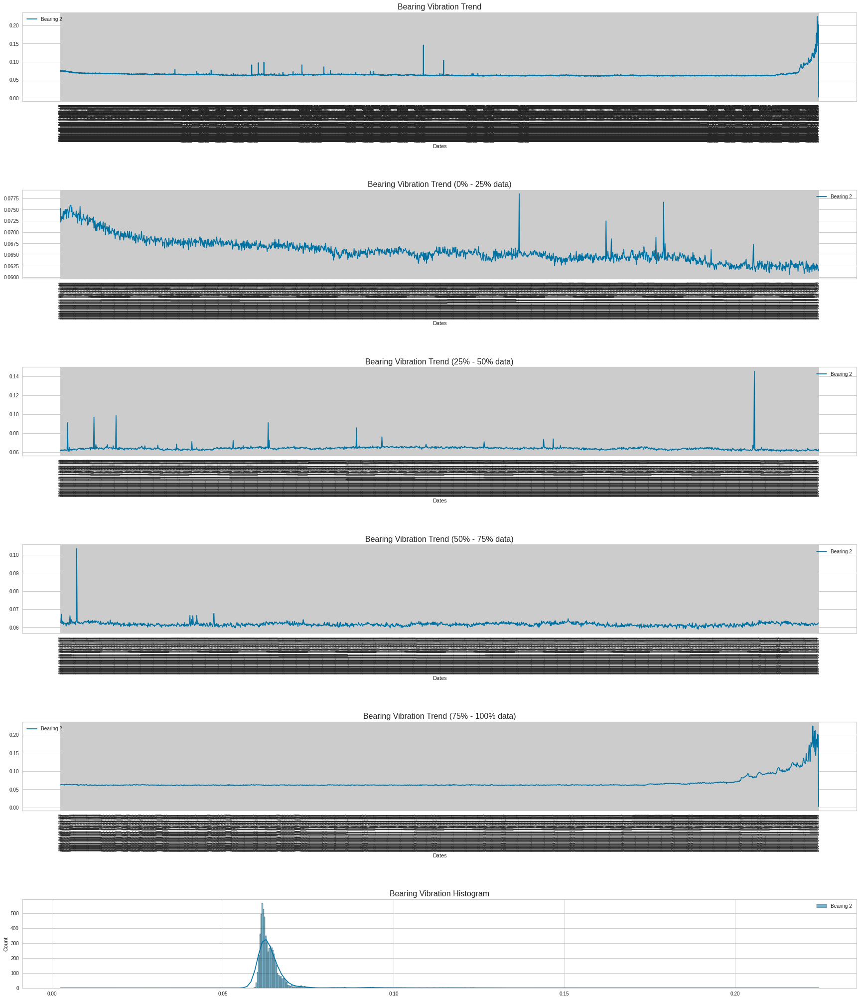


Shape of the data:  (6324, 1)


In [ ]:
bearing_data, measure_index = initial_exploration(dataset, Bearing)

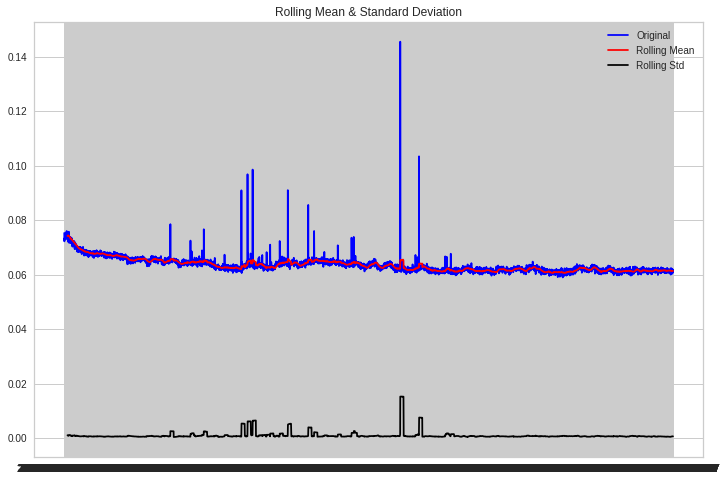

Results of Dickey-Fuller Test:

p-value = 0.0001. The series is likely stationary.
Test Statistic                   -4.777518
p-value                           0.000060
#Lags Used                       20.000000
Number of Observations Used    5464.000000
Critical Value (1%)              -3.431547
Critical Value (5%)              -2.862069
Critical Value (10%)             -2.567052
dtype: float64
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-14668.540, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-21807.028, Time=1.14 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-27682.569, Time=1.70 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-31806.664, Time=3.48 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-35080.369, Time=2.76 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-37377.537, Time=3.86 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-53351.753, Time=1.28 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-53675.380, Time=1.17 

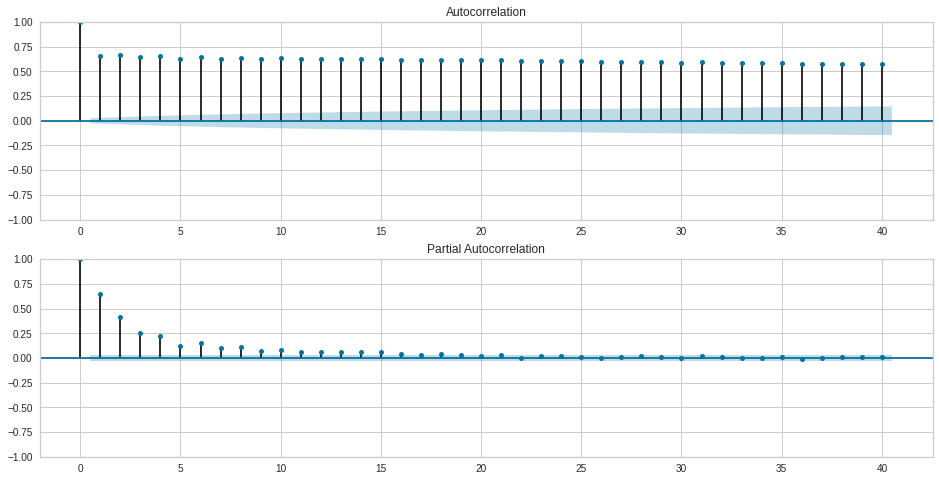

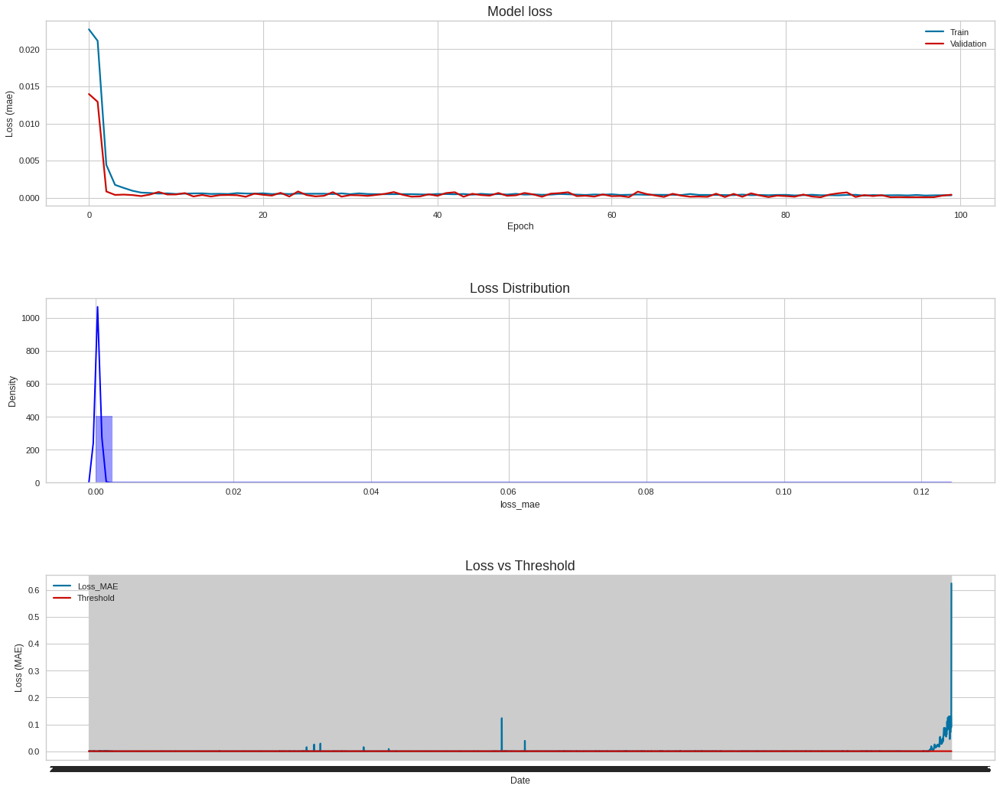

In [ ]:
bearing_data, measure = detect_outliers(bearing_data, measure, measure_index, normal_end_date="2004-04-12")

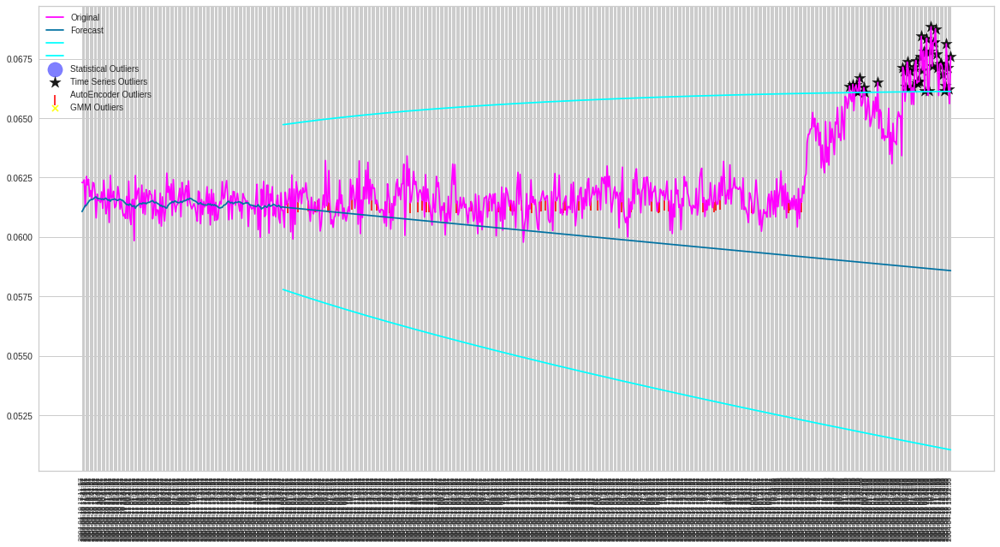

In [ ]:
graphical_result(bearing_data, Bearing, i1 = 5300, i2 = 6100)

In [ ]:
measure

,bearing,statistical_outliers,iqr_outliers,time_series_outliers,autoencoder_outliers,gmm_outliers
0,dataset2 Bearing 1,532,532,518,523,532
1,dataset2 Bearing 2,703,702,688,702,688
2,dataset2 Bearing 3,840,840,659,663,790
3,dataset2 Bearing 4,657,657,662,657,886
4,dataset3 Bearing 1,5967,5601,5495,5485,5485
5,dataset3 Bearing 2,6155,6113,6006,5489,6113


### Dataset 3 - Bearing 3

In [ ]:
dataset = dataset3
dataset.name = 'dataset3'
Bearing = 'Bearing 3'

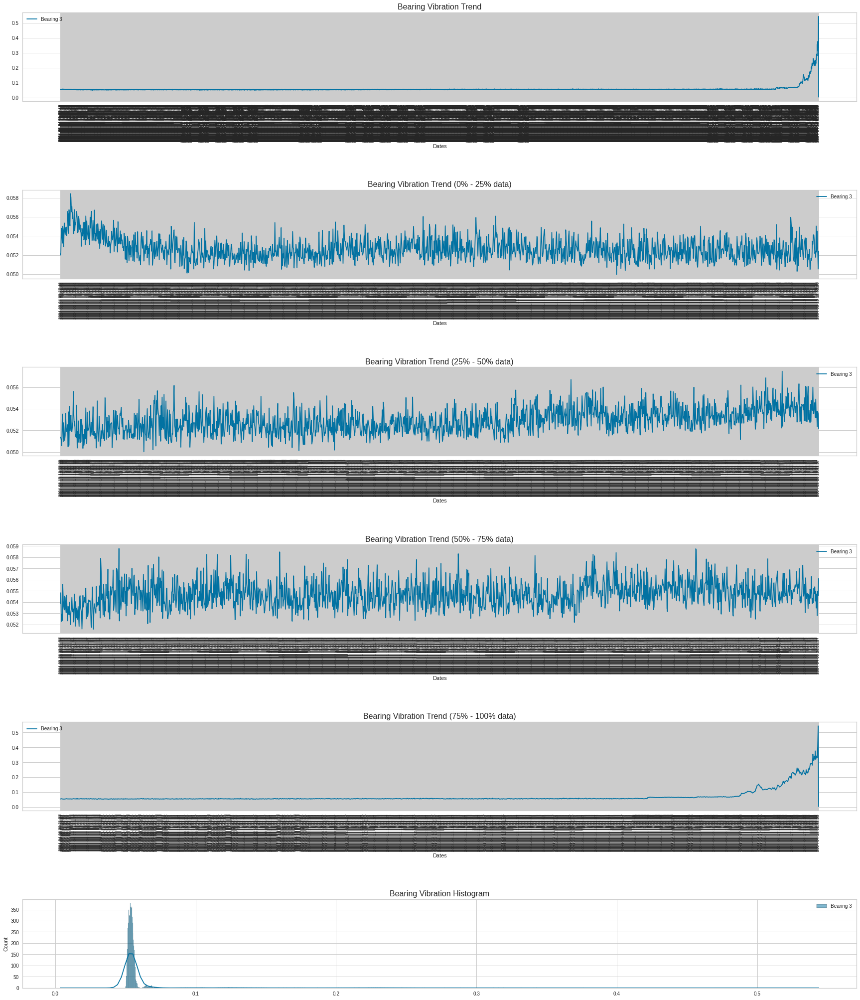


Shape of the data:  (6324, 1)


In [ ]:
bearing_data, measure_index = initial_exploration(dataset, Bearing)

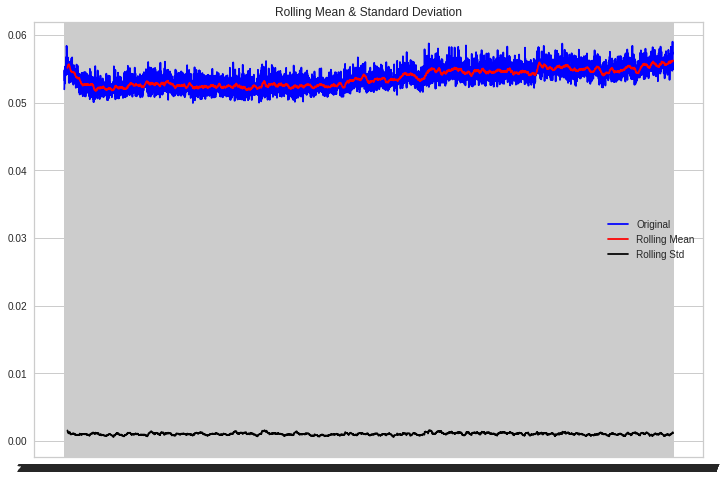

Results of Dickey-Fuller Test:

p-value = 0.0245. The series is likely non-stationary.
Test Statistic                   -3.128000
p-value                           0.024549
#Lags Used                       20.000000
Number of Observations Used    5464.000000
Critical Value (1%)              -3.431547
Critical Value (5%)              -2.862069
Critical Value (10%)             -2.567052
dtype: float64
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-16515.133, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-23829.771, Time=0.82 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-29944.020, Time=1.74 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-34552.901, Time=2.12 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-38109.004, Time=4.15 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-40664.570, Time=4.55 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-59526.756, Time=3.51 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-56733.485, Time=5

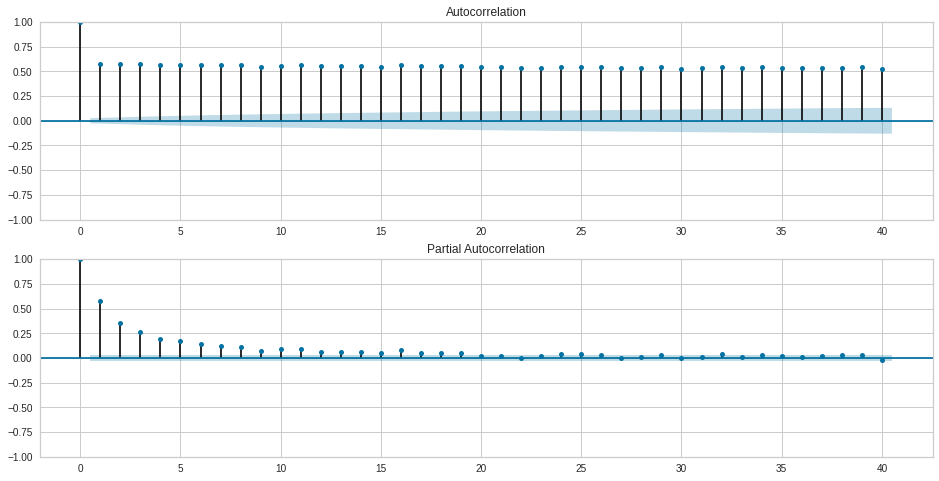

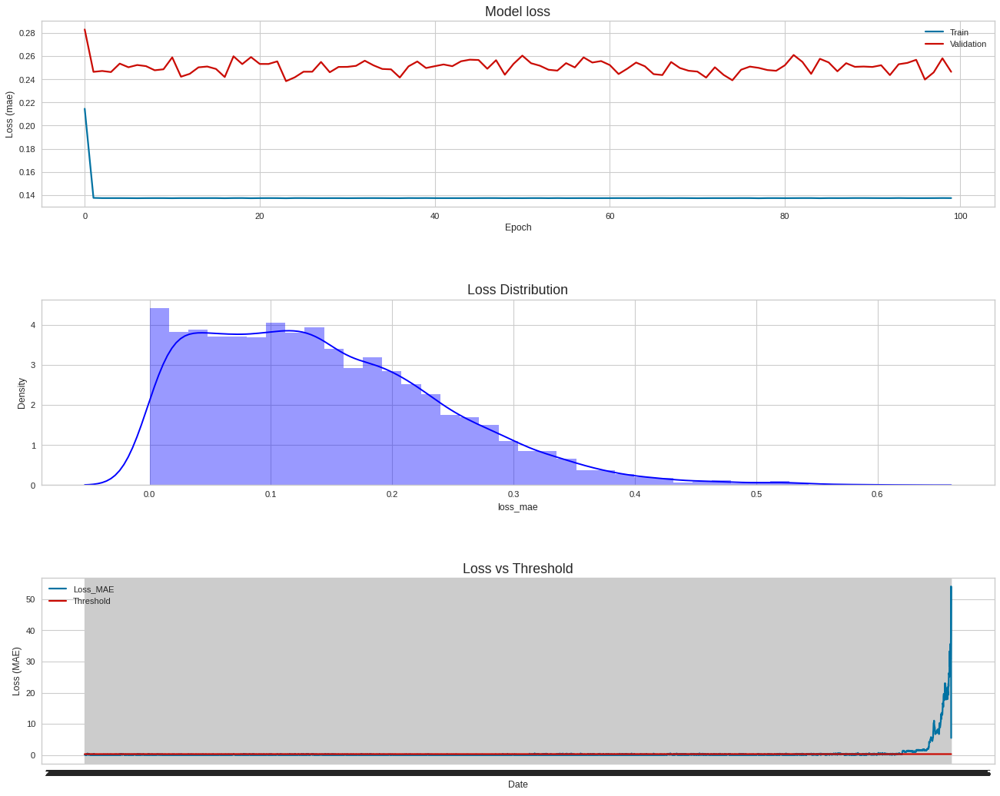

In [ ]:
bearing_data, measure = detect_outliers(bearing_data, measure, measure_index, normal_end_date="2004-04-12")

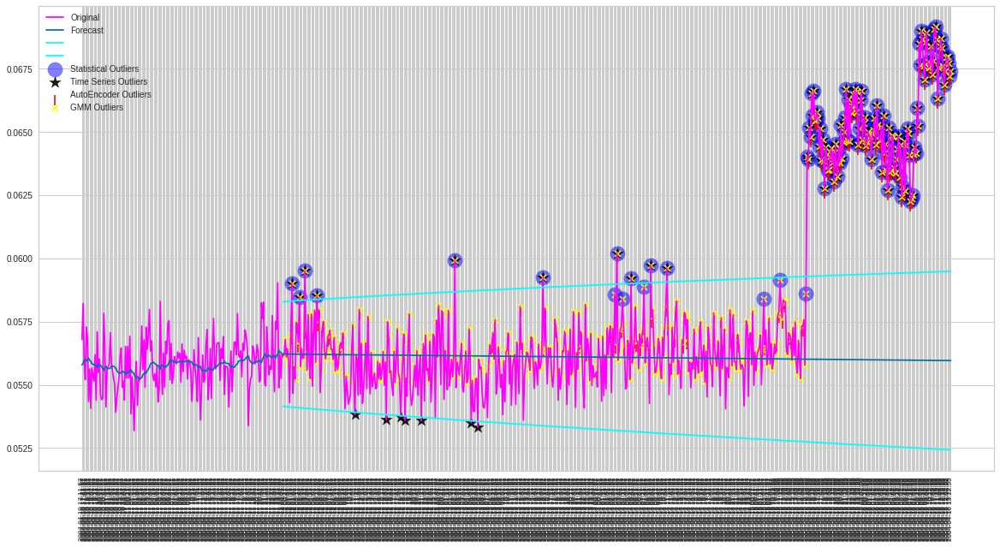

In [ ]:
graphical_result(bearing_data, Bearing, i1 = 5300, i2 = 6100)

In [ ]:
measure

,bearing,statistical_outliers,iqr_outliers,time_series_outliers,autoencoder_outliers,gmm_outliers
0,dataset2 Bearing 1,532,532,518,523,532
1,dataset2 Bearing 2,703,702,688,702,688
2,dataset2 Bearing 3,840,840,659,663,790
3,dataset2 Bearing 4,657,657,662,657,886
4,dataset3 Bearing 1,5967,5601,5495,5485,5485
5,dataset3 Bearing 2,6155,6113,6006,5489,6113
6,dataset3 Bearing 3,5493,5493,5493,5487,5485


### Dataset 3 - Bearing 4

In [ ]:
dataset = dataset3
dataset.name = 'dataset3'
Bearing = 'Bearing 4'

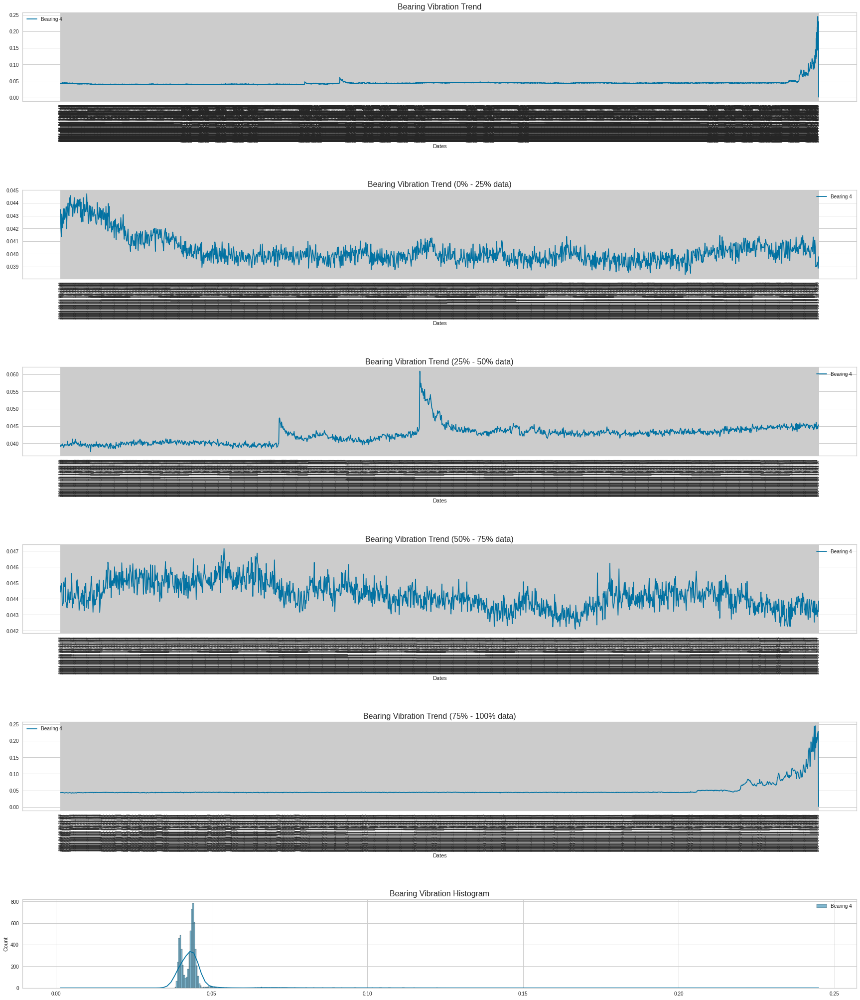


Shape of the data:  (6324, 1)


In [ ]:
bearing_data, measure_index = initial_exploration(dataset, Bearing)

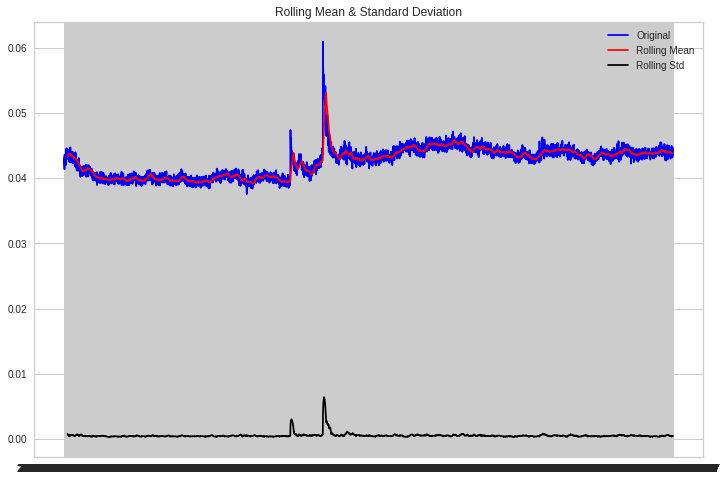

Results of Dickey-Fuller Test:

p-value = 0.0094. The series is likely stationary.
Test Statistic                   -3.448492
p-value                           0.009413
#Lags Used                       14.000000
Number of Observations Used    5470.000000
Critical Value (1%)              -3.431546
Critical Value (5%)              -2.862069
Critical Value (10%)             -2.567051
dtype: float64
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-19059.742, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-26489.365, Time=1.45 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-32941.840, Time=2.29 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-38062.341, Time=3.23 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-42082.745, Time=3.79 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-45102.549, Time=3.51 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-65640.110, Time=1.21 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-65652.948, Time=2.01 

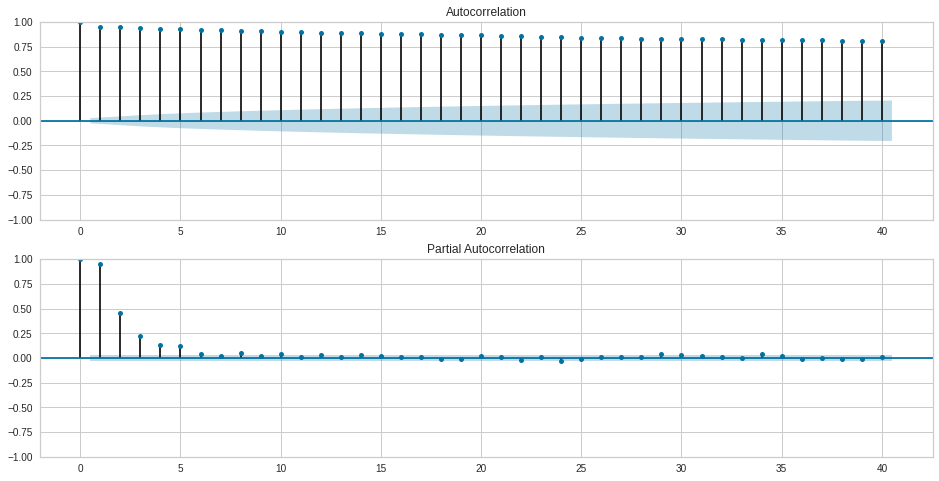

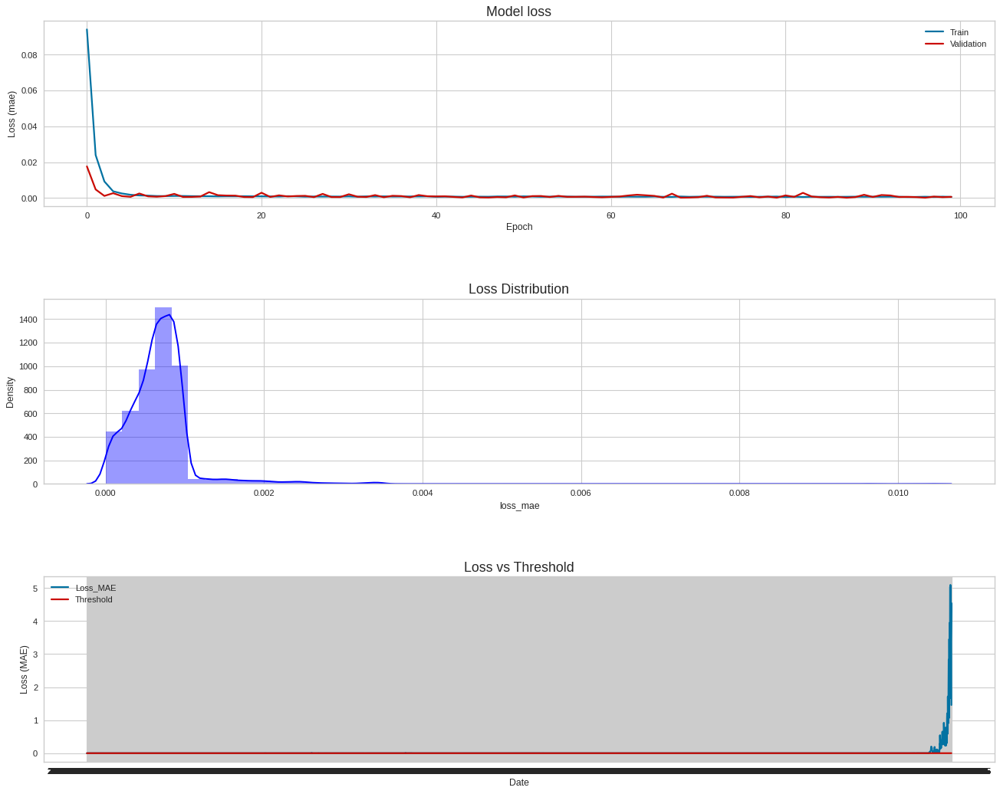

In [ ]:
bearing_data, measure = detect_outliers(bearing_data, measure, measure_index, normal_end_date="2004-04-12", n_components = 3)

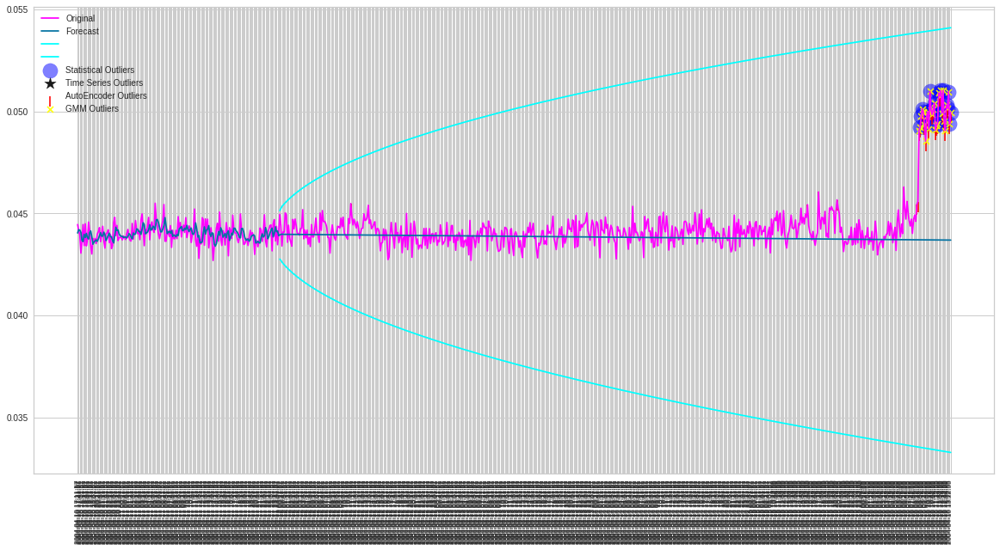

In [ ]:
graphical_result(bearing_data, Bearing, i1 = 5300, i2 =6100)

In [ ]:
measure

,bearing,statistical_outliers,iqr_outliers,time_series_outliers,autoencoder_outliers,gmm_outliers
0,dataset2 Bearing 1,532,532,518,523,532
1,dataset2 Bearing 2,703,702,688,702,688
2,dataset2 Bearing 3,840,840,659,663,790
3,dataset2 Bearing 4,657,657,662,657,886
4,dataset3 Bearing 1,5967,5601,5495,5485,5485
5,dataset3 Bearing 2,6155,6113,6006,5489,6113
6,dataset3 Bearing 3,5493,5493,5493,5487,5485
7,dataset3 Bearing 4,6071,6073,6161,5550,6070


## Multivariate

### Dataset 1 - Bearing 1 [Ch1(X) and Ch2(Y)]

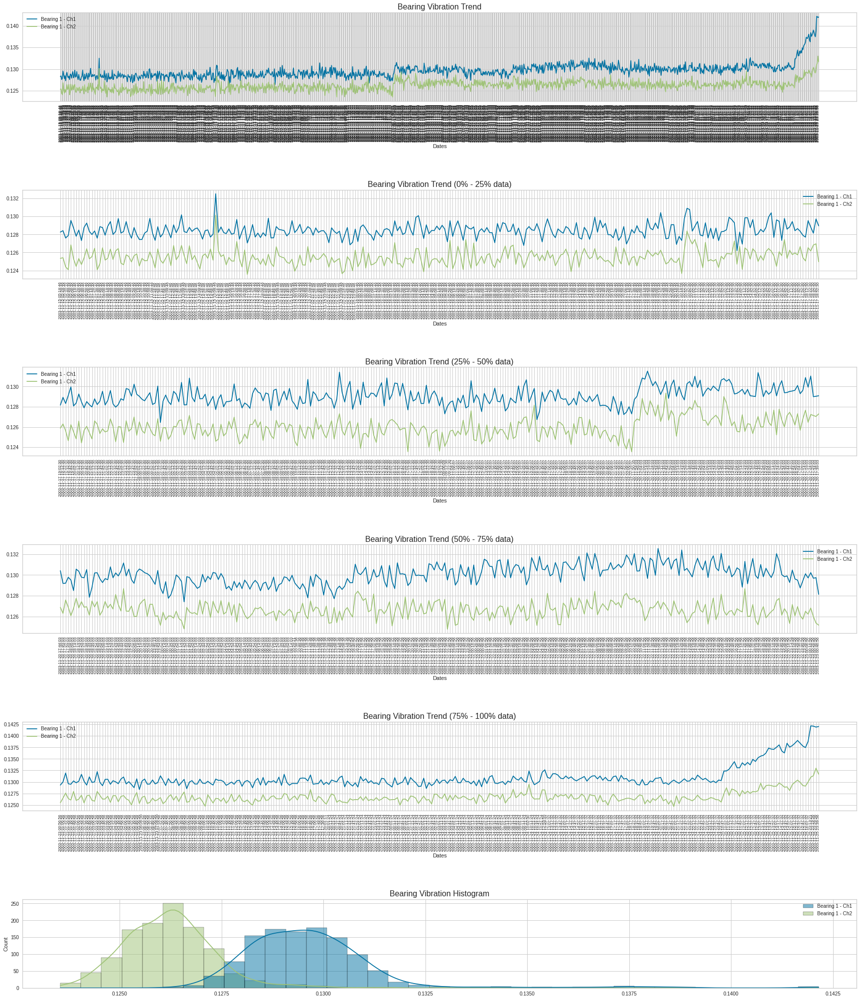


Shape of the data:  (1156, 2)


In [ ]:
bearings_xy = dataset1[['Bearing 1 - Ch1', 'Bearing 1 - Ch2']]
graphical_summary(bearings_xy.iloc[1000:, :])

In [ ]:
normal_end_date_xy = "2003-11-24"
train_xy, test_xy, training_xy, validation_xy = data_segregation(bearings_xy, normal_end_date_xy)

In [ ]:
# Created an temp dataset to find the statistical outliers using the functions
inter_xy = statistical_outliers(pd.DataFrame(bearings_xy.iloc[:, 0]), pd.DataFrame(train_xy.iloc[:, 0]))
bearings_xy = pd.concat([bearings_xy, pd.DataFrame(inter_xy.iloc[:, -1])], axis = 1)

In [ ]:
# gmm outliers
# inter_xy2 = time_series_outliers(pd.DataFrame(bearings_xy.iloc[:, 0]), pd.DataFrame(train_xy.iloc[:, 0]), p = 30, d = 0, q = 30)
# bearings_xy = pd.concat([bearings_xy, pd.DataFrame(inter_xy.iloc[:, -1])], axis = 1)
bearing_data = gmm_outliers(bearings_xy, train_xy, test_xy, n_components = 3)

In [ ]:
# PCA outliers
bearings_xy = pca_outliers(bearings_xy, train_xy, test_xy)

In [ ]:
measure_xy = pd.DataFrame(columns = ['bearing', 'statistical_outliers', 'gmm_outliers', 'pca_outliers'])

In [ ]:

intermed_xy = {'bearing':0, 'statistical_outliers':0, 'gmm_outliers':0, 'pca_outliers':0}
intermed_xy['bearing'] = 'bearing 1'

# min_index = min(bearings_xy[bearings_xy['statistical_outliers'] ==  1].index)
# min_loc = bearings_xy.index.get_loc(min_index)
# intermed_xy['statistical_outliers'] = min_loc
intermed_xy['statistical_outliers'] = 'NA'

min_index = min(bearings_xy[bearings_xy['gmm_outliers'] ==  1].index)
min_loc = bearings_xy.index.get_loc(min_index)
intermed_xy['gmm_outliers'] = min_loc

min_index = min(bearings_xy[bearings_xy['pca_outliers'] ==  1].index)
min_loc = bearings_xy.index.get_loc(min_index)
intermed_xy['pca_outliers'] = min_loc

measure_xy = measure_xy.append(intermed_xy, ignore_index = True)

In [ ]:
measure_xy

,bearing,statistical_outliers,gmm_outliers,pca_outliers
0,bearing 1,NA,2000,2100


In [ ]:
xy_sample_data = bearings_xy.iloc[1850:]

#### Results Exploration

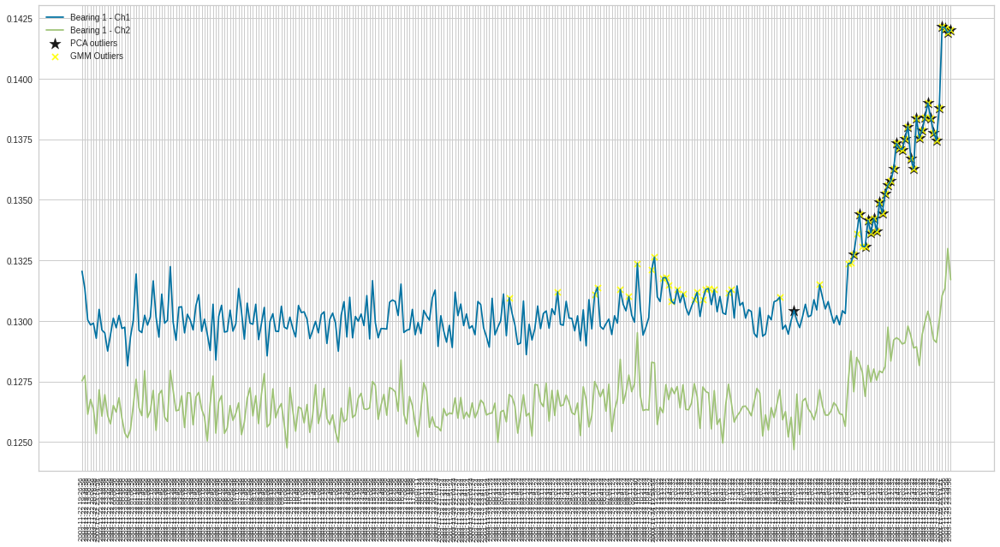

In [ ]:
plt.figure(figsize = (20, 10))
plt.plot(xy_sample_data[['Bearing 1 - Ch1', 'Bearing 1 - Ch2']])
# plt.scatter(x = xy_sample_data[xy_sample_data['statistical_outliers'] == 1].index ,y = xy_sample_data[xy_sample_data['statistical_outliers'] == 1]['Bearing 1 - Ch1'], c = 'blue', s= 300, marker = 'o', alpha = 0.5)
plt.scatter(x = xy_sample_data[xy_sample_data['pca_outliers'] == 1].index ,y = xy_sample_data[xy_sample_data['pca_outliers'] == 1]['Bearing 1 - Ch1'], c = 'black' , s = 200, marker = '*', alpha = 0.9)
# plt.scatter(x = sample_data[sample_data['autoencoder_outliers'] == 1].index ,y = sample_data[sample_data['autoencoder_outliers'] == 1]['Bearing 3 - Ch1'], c = 'red', s = 150, marker = 3, alpha = 0.9)
plt.scatter(x = xy_sample_data[xy_sample_data['gmm_outliers'] == 1].index ,y = xy_sample_data[xy_sample_data['gmm_outliers'] == 1]['Bearing 1 - Ch1'], c = 'yellow', s = 50, marker = 'x', alpha = 0.9)
# plt.plot(sample_data['ts_pred_fc'], c = 'b')
# plt.plot(sample_data['ts_lower'], c = 'cyan')
# plt.plot(sample_data['ts_upper'], c = 'cyan')
plt.xticks(rotation = 90, fontsize = 8)
plt.legend(['Bearing 1 - Ch1', 'Bearing 1 - Ch2', 'PCA outliers', 'GMM Outliers'])
plt.show()

### Dataset 1 - Bearing 2 [Ch1(X) and Ch2(Y)]

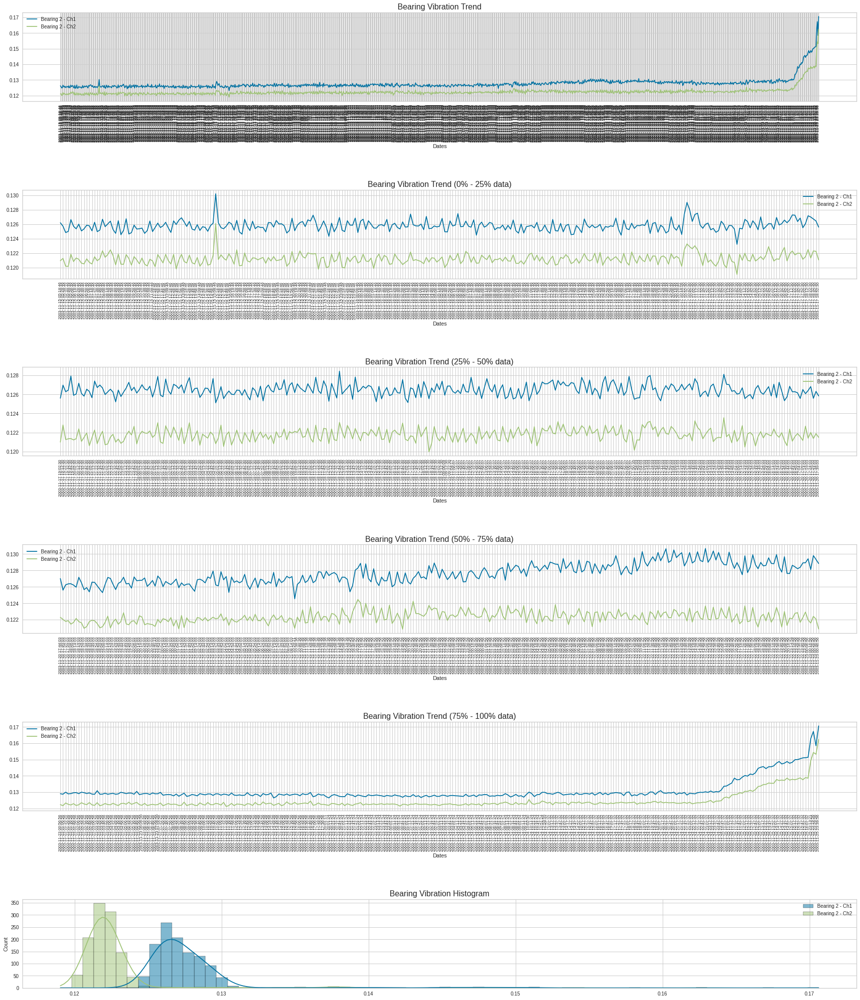


Shape of the data:  (1156, 2)


In [ ]:
bearings_xy = dataset1[['Bearing 2 - Ch1', 'Bearing 2 - Ch2']]
graphical_summary(bearings_xy.iloc[1000:, :])

In [ ]:
normal_end_date_xy = "2003-11-24"
train_xy, test_xy, training_xy, validation_xy = data_segregation(bearings_xy, normal_end_date_xy)

In [ ]:
# Created an temp dataset to find the statistical outliers using the functions
inter_xy = statistical_outliers(pd.DataFrame(bearings_xy.iloc[:, 0]), pd.DataFrame(train_xy.iloc[:, 0]))
bearings_xy = pd.concat([bearings_xy, pd.DataFrame(inter_xy.iloc[:, -1])], axis = 1)

In [ ]:
# gmm outliers
# inter_xy2 = time_series_outliers(pd.DataFrame(bearings_xy.iloc[:, 0]), pd.DataFrame(train_xy.iloc[:, 0]), p = 30, d = 0, q = 30)
# bearings_xy = pd.concat([bearings_xy, pd.DataFrame(inter_xy.iloc[:, -1])], axis = 1)
bearing_data = gmm_outliers(bearings_xy, train_xy, test_xy, n_components = 3)

In [ ]:
# PCA outliers
bearings_xy = pca_outliers(bearings_xy, train_xy, test_xy)

In [ ]:
bearings_xy.head(2)

,Bearing 2 - Ch1,Bearing 2 - Ch2,statistical_outliers,gmm_predictions,gmm_outliers,Mob dist,pca_outliers
2003-10-22 12:06:24,0.107147,0.102004,NaN,1,NaN,3.528462,NaN
2003-10-22 12:09:13,0.108189,0.102920,NaN,1,NaN,3.329937,NaN


In [ ]:
# measure_xy = pd.DataFrame(columns = ['bearing', 'statistical_outliers', 'gmm_outliers', 'pca_outliers'])

In [ ]:

intermed_xy = {'bearing':0, 'statistical_outliers':0, 'gmm_outliers':0, 'pca_outliers':0}
intermed_xy['bearing'] = 'bearing 2'

min_index = min(bearings_xy[bearings_xy['statistical_outliers'] ==  1].index)
min_loc = bearings_xy.index.get_loc(min_index)
intermed_xy['statistical_outliers'] = min_loc

min_index = min(bearings_xy[bearings_xy['gmm_outliers'] ==  1].index)
min_loc = bearings_xy.index.get_loc(min_index)
intermed_xy['gmm_outliers'] = min_loc

min_index = min(bearings_xy[bearings_xy['pca_outliers'] ==  1].index)
min_loc = bearings_xy.index.get_loc(min_index)
intermed_xy['pca_outliers'] = min_loc

measure_xy = measure_xy.append(intermed_xy, ignore_index = True)

In [ ]:
measure_xy

,bearing,statistical_outliers,gmm_outliers,pca_outliers
0,bearing 1,NA,2000,2100
1,bearing 2,2127,2119,2119


In [ ]:
xy_sample_data = bearings_xy.iloc[1850:]

#### Results Exploration

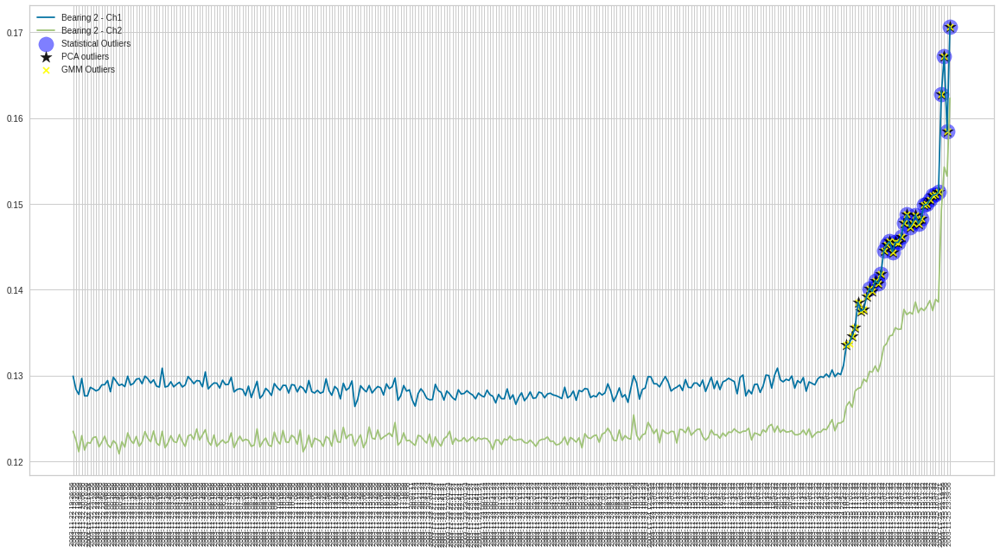

In [ ]:
plt.figure(figsize = (20, 10))
plt.plot(xy_sample_data[['Bearing 2 - Ch1', 'Bearing 2 - Ch2']])
plt.scatter(x = xy_sample_data[xy_sample_data['statistical_outliers'] == 1].index ,y = xy_sample_data[xy_sample_data['statistical_outliers'] == 1]['Bearing 2 - Ch1'], c = 'blue', s= 300, marker = 'o', alpha = 0.5)
plt.scatter(x = xy_sample_data[xy_sample_data['pca_outliers'] == 1].index ,y = xy_sample_data[xy_sample_data['pca_outliers'] == 1]['Bearing 2 - Ch1'], c = 'black' , s = 200, marker = '*', alpha = 0.9)
# plt.scatter(x = sample_data[sample_data['autoencoder_outliers'] == 1].index ,y = sample_data[sample_data['autoencoder_outliers'] == 1]['Bearing 3 - Ch1'], c = 'red', s = 150, marker = 3, alpha = 0.9)
plt.scatter(x = xy_sample_data[xy_sample_data['gmm_outliers'] == 1].index ,y = xy_sample_data[xy_sample_data['gmm_outliers'] == 1]['Bearing 2 - Ch1'], c = 'yellow', s = 50, marker = 'x', alpha = 0.9)
# plt.plot(sample_data['ts_pred_fc'], c = 'b')
# plt.plot(sample_data['ts_lower'], c = 'cyan')
# plt.plot(sample_data['ts_upper'], c = 'cyan')
plt.xticks(rotation = 90, fontsize = 8)
plt.legend(['Bearing 2 - Ch1', 'Bearing 2 - Ch2', 'Statistical Outliers', 'PCA outliers', 'GMM Outliers'])
plt.show()

### Dataset 1 - Bearing 3 [Ch1(X) and Ch2(Y)]

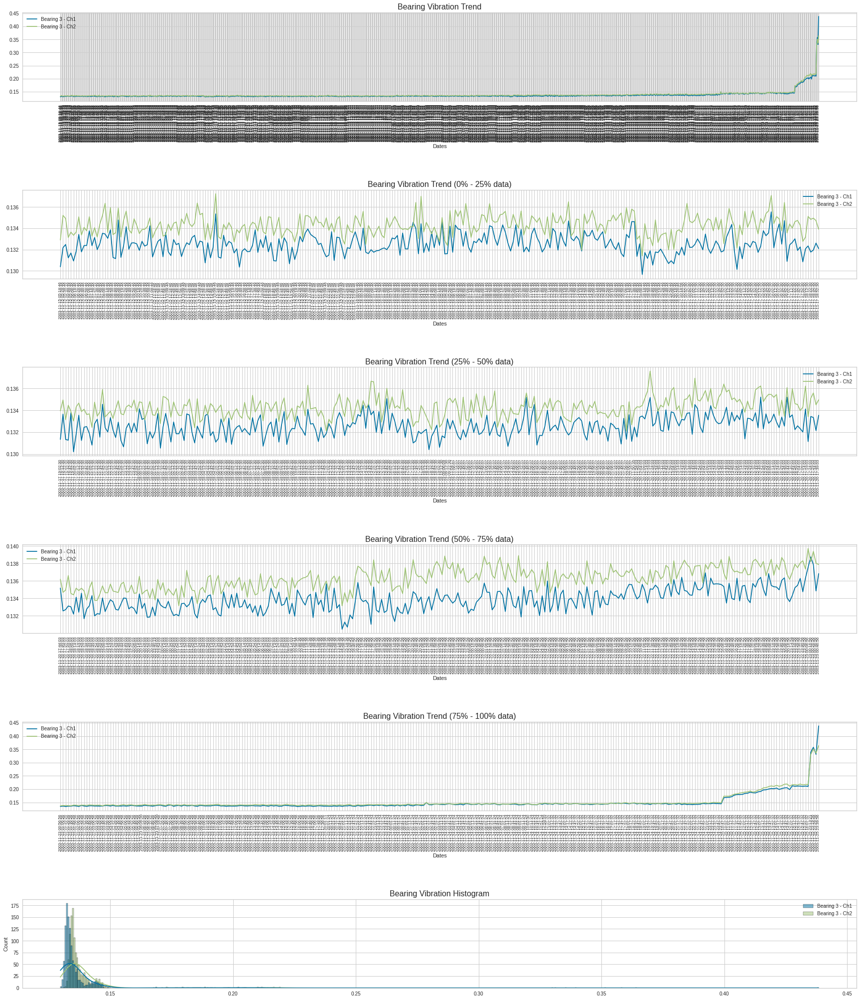


Shape of the data:  (1156, 2)


In [ ]:
bearings_xy = dataset1[['Bearing 3 - Ch1', 'Bearing 3 - Ch2']]
graphical_summary(bearings_xy.iloc[1000:, :])

In [ ]:
normal_end_date_xy = "2003-11-24"
train_xy, test_xy, training_xy, validation_xy = data_segregation(bearings_xy, normal_end_date_xy)

In [ ]:
# Created an temp dataset to find the statistical outliers using the functions
inter_xy = statistical_outliers(pd.DataFrame(bearings_xy.iloc[:, 0]), pd.DataFrame(train_xy.iloc[:, 0]))
bearings_xy = pd.concat([bearings_xy, pd.DataFrame(inter_xy.iloc[:, -1])], axis = 1)

In [ ]:
# gmm outliers
# inter_xy2 = time_series_outliers(pd.DataFrame(bearings_xy.iloc[:, 0]), pd.DataFrame(train_xy.iloc[:, 0]), p = 30, d = 0, q = 30)
# bearings_xy = pd.concat([bearings_xy, pd.DataFrame(inter_xy.iloc[:, -1])], axis = 1)
bearing_data = gmm_outliers(bearings_xy, train_xy, test_xy, n_components = 3)

In [ ]:
# PCA outliers
bearings_xy = pca_outliers(bearings_xy, train_xy, test_xy)

In [ ]:
bearings_xy.head(2)

,Bearing 3 - Ch1,Bearing 3 - Ch2,statistical_outliers,gmm_predictions,gmm_outliers,Mob dist,pca_outliers
2003-10-22 12:06:24,0.106149,0.108150,NaN,1,NaN,3.663922,NaN
2003-10-22 12:09:13,0.106661,0.108458,NaN,1,NaN,3.568707,NaN


In [ ]:
# measure_xy = pd.DataFrame(columns = ['bearing', 'statistical_outliers', 'gmm_outliers', 'pca_outliers'])

In [ ]:

intermed_xy = {'bearing':0, 'statistical_outliers':0, 'gmm_outliers':0, 'pca_outliers':0}
intermed_xy['bearing'] = 'bearing 3'

min_index = min(bearings_xy[bearings_xy['statistical_outliers'] ==  1].index)
min_loc = bearings_xy.index.get_loc(min_index)
intermed_xy['statistical_outliers'] = min_loc

min_index = min(bearings_xy[bearings_xy['gmm_outliers'] ==  1].index)
min_loc = bearings_xy.index.get_loc(min_index)
intermed_xy['gmm_outliers'] = min_loc

min_index = min(bearings_xy[bearings_xy['pca_outliers'] ==  1].index)
min_loc = bearings_xy.index.get_loc(min_index)
intermed_xy['pca_outliers'] = min_loc

measure_xy = measure_xy.append(intermed_xy, ignore_index = True)

In [ ]:
measure_xy

,bearing,statistical_outliers,gmm_outliers,pca_outliers
0,bearing 1,NA,2000,2100
1,bearing 2,2127,2119,2119
2,bearing 3,2119,1993,2006


In [ ]:
xy_sample_data = bearings_xy.iloc[1850:]

#### Results Exploration

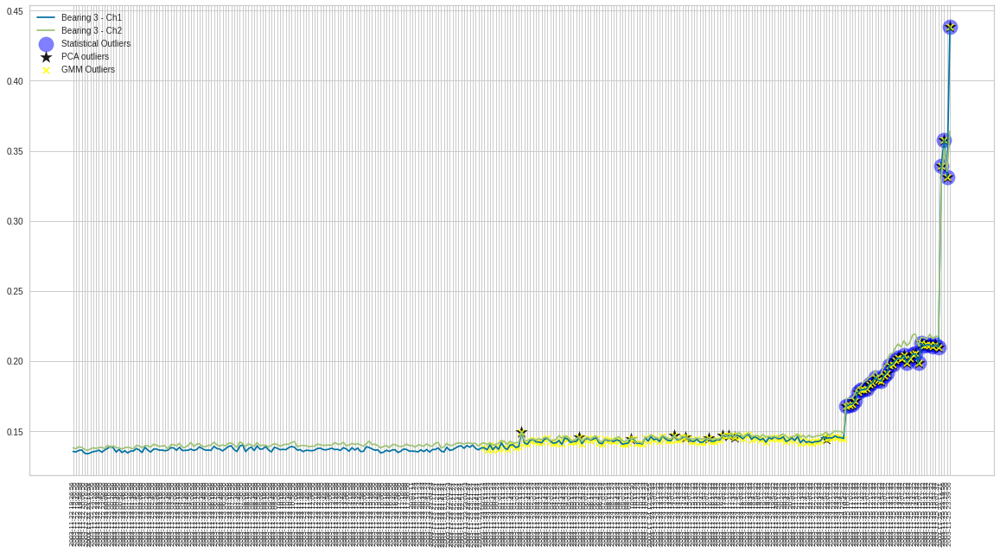

In [ ]:
plt.figure(figsize = (20, 10))
plt.plot(xy_sample_data[['Bearing 3 - Ch1', 'Bearing 3 - Ch2']])
plt.scatter(x = xy_sample_data[xy_sample_data['statistical_outliers'] == 1].index ,y = xy_sample_data[xy_sample_data['statistical_outliers'] == 1]['Bearing 3 - Ch1'], c = 'blue', s= 300, marker = 'o', alpha = 0.5)
plt.scatter(x = xy_sample_data[xy_sample_data['pca_outliers'] == 1].index ,y = xy_sample_data[xy_sample_data['pca_outliers'] == 1]['Bearing 3 - Ch1'], c = 'black' , s = 200, marker = '*', alpha = 0.9)
# plt.scatter(x = sample_data[sample_data['autoencoder_outliers'] == 1].index ,y = sample_data[sample_data['autoencoder_outliers'] == 1]['Bearing 3 - Ch1'], c = 'red', s = 150, marker = 3, alpha = 0.9)
plt.scatter(x = xy_sample_data[xy_sample_data['gmm_outliers'] == 1].index ,y = xy_sample_data[xy_sample_data['gmm_outliers'] == 1]['Bearing 3 - Ch1'], c = 'yellow', s = 50, marker = 'x', alpha = 0.9)
# plt.plot(sample_data['ts_pred_fc'], c = 'b')
# plt.plot(sample_data['ts_lower'], c = 'cyan')
# plt.plot(sample_data['ts_upper'], c = 'cyan')
plt.xticks(rotation = 90, fontsize = 8)
plt.legend(['Bearing 3 - Ch1', 'Bearing 3 - Ch2', 'Statistical Outliers', 'PCA outliers', 'GMM Outliers'])
plt.show()

### Dataset 1 - Bearing 4 [Ch1(X) and Ch2(Y)]

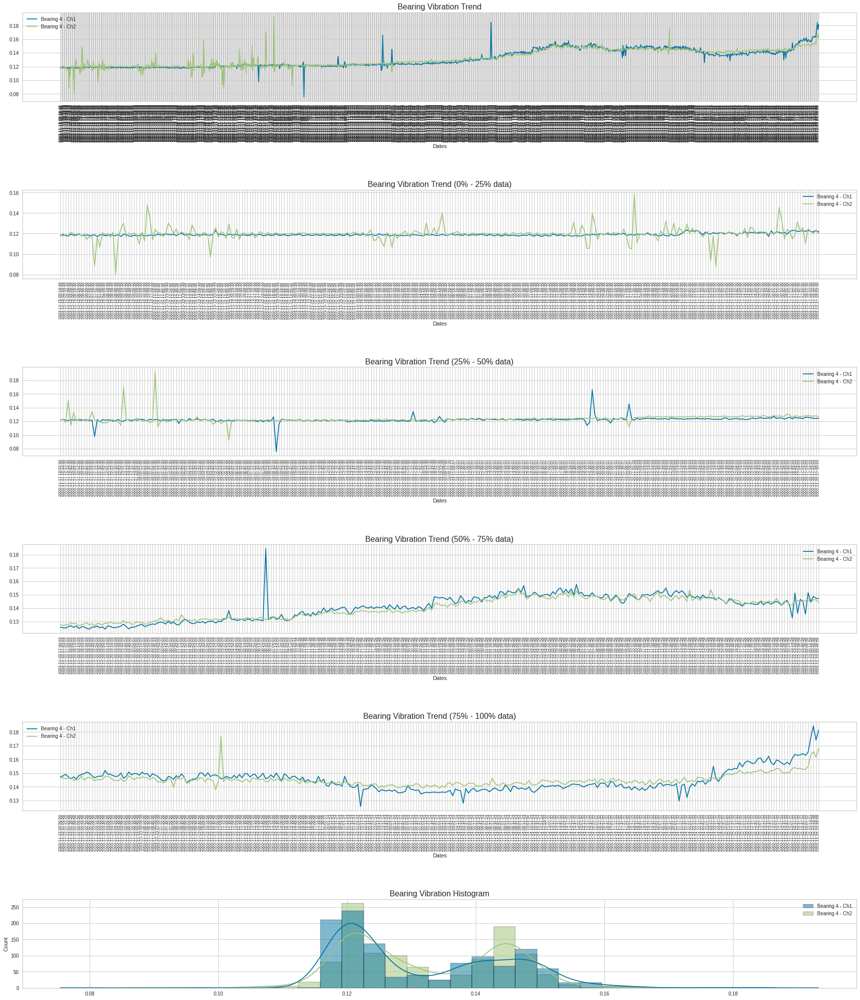


Shape of the data:  (1156, 2)


In [ ]:
bearings_xy = dataset1[['Bearing 4 - Ch1', 'Bearing 4 - Ch2']]
graphical_summary(bearings_xy.iloc[1000:, :])

In [ ]:
normal_end_date_xy = "2003-11-24"
train_xy, test_xy, training_xy, validation_xy = data_segregation(bearings_xy, normal_end_date_xy)

In [ ]:
# Created an temp dataset to find the statistical outliers using the functions
inter_xy = statistical_outliers(pd.DataFrame(bearings_xy.iloc[:, 0]), pd.DataFrame(train_xy.iloc[:, 0]))
bearings_xy = pd.concat([bearings_xy, pd.DataFrame(inter_xy.iloc[:, -1])], axis = 1)

In [ ]:
# gmm outliers
# inter_xy2 = time_series_outliers(pd.DataFrame(bearings_xy.iloc[:, 0]), pd.DataFrame(train_xy.iloc[:, 0]), p = 30, d = 0, q = 30)
# bearings_xy = pd.concat([bearings_xy, pd.DataFrame(inter_xy.iloc[:, -1])], axis = 1)
bearing_data = gmm_outliers(bearings_xy, train_xy, test_xy, n_components = 3)

In [ ]:
# PCA outliers
bearings_xy = pca_outliers(bearings_xy, train_xy, test_xy)

In [ ]:

bearings_xy.head(2)

,Bearing 4 - Ch1,Bearing 4 - Ch2,statistical_outliers,gmm_predictions,gmm_outliers,Mob dist,pca_outliers
2003-10-22 12:06:24,0.094803,0.099513,NaN,2,NaN,2.142027,NaN
2003-10-22 12:09:13,0.095070,0.093587,NaN,2,NaN,2.364932,NaN


In [ ]:
# measure_xy = pd.DataFrame(columns = ['bearing', 'statistical_outliers', 'gmm_outliers', 'pca_outliers'])

In [ ]:

intermed_xy = {'bearing':0, 'statistical_outliers':0, 'gmm_outliers':0, 'pca_outliers':0}
intermed_xy['bearing'] = 'bearing 4'

min_index = min(bearings_xy[bearings_xy['statistical_outliers'] ==  1].index)
min_loc = bearings_xy.index.get_loc(min_index)
intermed_xy['statistical_outliers'] = min_loc

min_index = min(bearings_xy[bearings_xy['gmm_outliers'] ==  1].index)
min_loc = bearings_xy.index.get_loc(min_index)
intermed_xy['gmm_outliers'] = min_loc

min_index = min(bearings_xy[bearings_xy['pca_outliers'] ==  1].index)
min_loc = bearings_xy.index.get_loc(min_index)
intermed_xy['pca_outliers'] = min_loc

measure_xy = measure_xy.append(intermed_xy, ignore_index = True)

In [ ]:
measure_xy

,bearing,statistical_outliers,gmm_outliers,pca_outliers
0,bearing 1,NA,2000,2100
1,bearing 2,2127,2119,2119
2,bearing 3,2119,1993,2006
3,bearing 4,2136,1993,2125


In [ ]:
xy_sample_data = bearings_xy.iloc[1850:]

#### Results Exploration

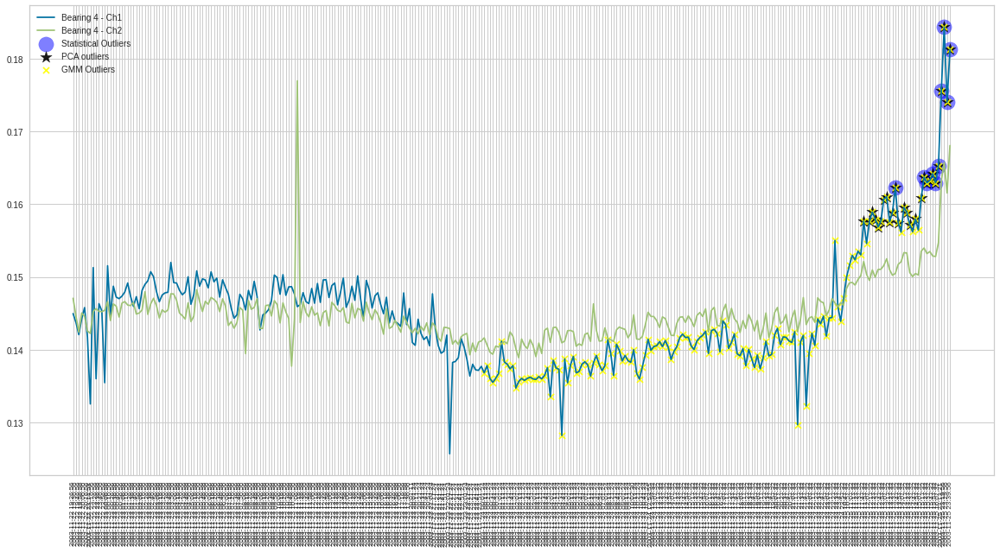

In [ ]:
plt.figure(figsize = (20, 10))
plt.plot(xy_sample_data[['Bearing 4 - Ch1', 'Bearing 4 - Ch2']])
plt.scatter(x = xy_sample_data[xy_sample_data['statistical_outliers'] == 1].index ,y = xy_sample_data[xy_sample_data['statistical_outliers'] == 1]['Bearing 4 - Ch1'], c = 'blue', s= 300, marker = 'o', alpha = 0.5)
plt.scatter(x = xy_sample_data[xy_sample_data['pca_outliers'] == 1].index ,y = xy_sample_data[xy_sample_data['pca_outliers'] == 1]['Bearing 4 - Ch1'], c = 'black' , s = 200, marker = '*', alpha = 0.9)
# plt.scatter(x = sample_data[sample_data['autoencoder_outliers'] == 1].index ,y = sample_data[sample_data['autoencoder_outliers'] == 1]['Bearing 3 - Ch1'], c = 'red', s = 150, marker = 3, alpha = 0.9)
plt.scatter(x = xy_sample_data[xy_sample_data['gmm_outliers'] == 1].index ,y = xy_sample_data[xy_sample_data['gmm_outliers'] == 1]['Bearing 4 - Ch1'], c = 'yellow', s = 50, marker = 'x', alpha = 0.9)
# plt.plot(sample_data['ts_pred_fc'], c = 'b')
# plt.plot(sample_data['ts_lower'], c = 'cyan')
# plt.plot(sample_data['ts_upper'], c = 'cyan')
plt.xticks(rotation = 90, fontsize = 8)
plt.legend(['Bearing 4 - Ch1', 'Bearing 4 - Ch2', 'Statistical Outliers', 'PCA outliers', 'GMM Outliers'])
plt.show()

# Final Recommendation

In [ ]:
measure.to_csv('univariate_results.csv')
measure_xy.to_csv('multivariate_results.csv')

## Univariate

In [ ]:
measure

,bearing,statistical_outliers,iqr_outliers,time_series_outliers,autoencoder_outliers,gmm_outliers
0,dataset2 Bearing 1,532,532,518,523,532
1,dataset2 Bearing 2,703,702,688,702,688
2,dataset2 Bearing 3,840,840,659,663,790
3,dataset2 Bearing 4,657,657,662,657,886
4,dataset3 Bearing 1,5967,5601,5495,5485,5485
5,dataset3 Bearing 2,6155,6113,6006,5489,6113
6,dataset3 Bearing 3,5493,5493,5493,5487,5485
7,dataset3 Bearing 4,6071,6073,6161,5550,6070


In [ ]:
univariate_res = measure.copy()
univariate_res['Earliest_Detection'] = [x for x in measure.iloc[:, 1:].min(axis = 1)]
univariate_res['time series vs statistical'] = univariate_res['statistical_outliers'] - univariate_res['time_series_outliers']
univariate_res['autoencoder vs statistical'] = univariate_res['statistical_outliers'] - univariate_res['autoencoder_outliers']
univariate_res['gmm vs statistical'] = univariate_res['statistical_outliers'] - univariate_res['gmm_outliers']

In [ ]:
univariate_res.iloc[:, -3:].mean()

time series vs statistical     92.000
autoencoder vs statistical    232.750
gmm vs statistical             46.125
dtype: float64

<font color = 'red'>**Autoencoder works better in early detection.**

<font color = 'red'>**In case of limited resource availability, time series models can be used instead of autoencoder.**

## Multivariate

In [ ]:
measure_xy

,bearing,statistical_outliers,gmm_outliers,pca_outliers
0,bearing 1,NA,2000,2100
1,bearing 2,2127,2119,2119
2,bearing 3,2119,1993,2006
3,bearing 4,2136,1993,2125


<font color = 'red'>**Clearly GMM Models works better for early detection of anomalies and is a much simpler approach.**